# Check Stokes V avging

- computed avg I and V of 4x4 HRT pixels, to compare to the corresponding one HMI pixel
- discrepancy between the avg and the HMI pixel
- larger discrepancy in Stokes I than V
![image.png](attachment:image.png)
![image-2.png](attachment:image-2.png)
![image-3.png](attachment:image-3.png)
![image-4.png](attachment:image-4.png)

In [10]:
from blos_binning_helper import *
import matplotlib.pyplot as plt
import numpy as np
from astropy.io import fits

from matplotlib.gridspec import GridSpec

from IPython.core.display import display, HTML
display(HTML("<style>.container { width:100% !important; }</style>"))

# import matplotlib as mpl
# mpl.rcParams['figure.dpi'] = 100
font = {'size'   : 18}

import matplotlib as mpl
mpl.rcParams['figure.dpi'] = 300
mpl.rc_file_defaults()
plt.rc('font', **font)
mpl.rcParams['image.origin'] = 'lower'
plt.rcParams['xtick.direction'] = 'in'
plt.rcParams['ytick.direction'] = 'in'

/tmp/ipykernel_61421/375909465.py:8: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [12]:
#old code
#data_con = constituent data, ie the data that are averaged to make 'data'

def get_inst_stokes(folder, angle, snapshot, default_dir, inst, remainder_mode = 'round', pixel_res=20.83333333, downscale_mean = False):
    data = load_data(folder, angle, snapshot, default_dir=default_dir)
    ic = data[:,:,0,:50].mean()
    dshape = data.shape[0]
    if inst == 'onepix':
        data = rebin(data,(1,1,4,251),downscale_mean)
    elif inst == 'muram':
        return data/ic
    else:
        new_shape = get_inst_shape(inst, angle, remainder_mode, dshape, pixel_res)
        data = interp_data_to_nearest_divisible_integer(data, new_shape)
        data = rebin(data, new_shape, downscale_mean)
    return data/ic


def get_indices_of_constituent_pixels(index, data, data_con, inst_res, inst_res_con):
    inst_fac = inst_res/inst_res_con
    con_mid_pix = (round((index[0]+0.5)*inst_fac,0),round((index[1]+0.5)*inst_fac,0))
    botleft = (round(con_mid_pix[0]-inst_fac/2,0),round(con_mid_pix[1]-inst_fac/2,0))
    topright = (botleft[0]+3,botleft[1]+3) #round(con_mid_pix[1]+inst_fac/2,0)
    row_slice = slice(int(botleft[0]),int(topright[0]),int(topright[0]-botleft[0]))
    col_slice = slice(int(botleft[1]),int(topright[1]),int(topright[1]-botleft[1]))
    return row_slice, col_slice


def plot_constituent_same_panel(data_con, data, row_slice, col_slice, loc, stokes = 0, title = None):
    #row_slice, col_slice = get_indices_of_constituent_pixels(loc,data,data_con,inst_res,inst_con_res)
    size = int(row_slice.stop-row_slice.start+1)
    print(size*size)
    plt.figure(figsize=(16,8))
    wv = np.linspace(-0.35,0.35,51)
    plt.subplot(141)
    tmp = np.zeros((51))
    for i in range(size*size):
        row =  row_slice.stop - i//size
        col =  col_slice.start + i%size
        plt.plot(wv,data_con[row,col,stokes,100:151], label = f"({col},{row}) (x,y)")
        tmp += data_con[row,col,stokes,100:151]
    if title is not None:
        plt.title(f"{title[0]}")
    #plt.legend()
    if stokes == 0:
        plt.ylim(0,1.4)
    elif stokes == 3:
        plt.ylim(-0.2,0.2)
        
    plt.subplot(142)
    plt.title("Avg")
    plt.plot(wv, tmp/(size*size))
    if stokes == 0:
        plt.ylim(0,1.4)
    elif stokes == 3:
        plt.ylim(-0.2,0.2)
    
    plt.subplot(143)
    plt.plot(wv,data[loc[0],loc[1],stokes,100:151])
    if title is not None:
        plt.title(f"{title[1]}")
    if stokes == 0:
        plt.ylim(0,1.4)
    elif stokes == 3:
        plt.ylim(-0.2,0.2)
        
    plt.subplot(144)
    plt.plot(wv,data[loc[0],loc[1],stokes,100:151]-tmp/(size*size))
    plt.title("Diff")
#     if stokes == 0:
#         plt.ylim(0,1.4)
#     elif stokes == 3:
#         plt.ylim(-0.2,0.2)
        
    plt.show()

In [14]:
def get_stokes_interped_and_rebin(folder, angle, snapshot, inst=None, downscale_mean=False, \
                                  remainder_mode='round', dshape=288, pixel_res=20.833333, \
                                  default_dir='/export/local/scratch/sinjan/spinor_fwd/'):
    print_console(folder, angle, snapshot)
    data = load_data(folder, angle, snapshot, default_dir=default_dir)
    if inst == 'onepix':
        data = rebin(data,(1,1,4,251),downscale_mean)
        return data
    else:
        new_shape = get_inst_shape(inst, angle, remainder_mode, dshape, pixel_res)
        interp = interp_data_to_nearest_divisible_integer(data, new_shape)
        data = rebin(interp, new_shape, downscale_mean)
        return data, interp

In [16]:
muram_data,muram_interp = get_stokes_interped_and_rebin('ngrey_200G', '00', '200000', inst='MURaM', \
                                                    downscale_mean=False, remainder_mode='round')

# muram_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
#                                0.35, inst='MURaM',downscale_mean=False, \
#                                remainder_mode='round', refwv=6173.341, \
#                                dshape=288, pixel_res=20.833333, \
#                                blos_method='CMILOS', return_mean=False)
muram_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
                                 0.35, inst='MURaM', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  288.0
inst_x: : 288.0
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  288.0
inst_x: : 288.0
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(288, 288, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [18]:
muram_data_60,muram_interp_60 = get_stokes_interped_and_rebin('ngrey_200G', '60', '200000', inst='MURaM', \
                                                    downscale_mean=False, remainder_mode='round')

muram_blos_60 = get_blos_inst_pixel('ngrey_200G', '60', '200000', \
                                 0.35, inst='MURaM', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  144.0
inst_x: : 288.0
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  144.0
inst_x: : 288.0
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(144, 288, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [ ]:
muram_data_72,muram_interp_72 = get_stokes_interped_and_rebin('ngrey_200G', '72_6', '200000', inst='MURaM', \
                                                    downscale_mean=False, remainder_mode='round')

muram_blos_72 = get_blos_inst_pixel('ngrey_200G', '72_6', '200000', \
                                 0.35, inst='MURaM', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

In [28]:
hrt_data,hrt_interp = get_stokes_interped_and_rebin('ngrey_200G', '00', '200000', inst='HRT', \
                                                    downscale_mean=False, remainder_mode='round')

hrt_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
                                0.35, inst='HRT', downscale_mean=False, \
                                remainder_mode='round', refwv=6173.341, \
                                dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                return_mean=False, \
                                niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  59.0
inst_x: : 59.0
interp_y:  295
interp_x:  295
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  59.0
inst_x: : 59.0
interp_y:  295
interp_x:  295
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(59, 59, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [29]:
hrt_data_60,hrt_interp_60 = get_stokes_interped_and_rebin('ngrey_200G', '60', '200000', inst='HRT', \
                                                    downscale_mean=False, remainder_mode='round')

hrt_blos_60 = get_blos_inst_pixel('ngrey_200G', '60', '200000', \
                                 0.35, inst='HRT', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  30.0
inst_x: : 59.0
interp_y:  300
interp_x:  295
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  30.0
inst_x: : 59.0
interp_y:  300
interp_x:  295
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(30, 59, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [ ]:
hrt_data_72,hrt_interp_72 = get_stokes_interped_and_rebin('ngrey_200G', '72_6', '200000', inst='HRT', \
                                                    downscale_mean=False, remainder_mode='round')

hrt_blos_72 = get_blos_inst_pixel('ngrey_200G', '72_6', '200000', \
                                 0.35, inst='HRT', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=True, \
                                 niter=50, ext='_1551', q_u_0 = False)

In [30]:
hmi_data,hmi_interp = get_stokes_interped_and_rebin('ngrey_200G', '00', '200000', inst='HMI', \
                                                    downscale_mean=False, remainder_mode='round')

hmi_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
                                 0.35, inst='HMI', downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  17.0
inst_x: : 17.0
interp_y:  289
interp_x:  289
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  17.0
inst_x: : 17.0
interp_y:  289
interp_x:  289
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(17, 17, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [31]:
hmi_data_60,hmi_interp_60 = get_stokes_interped_and_rebin('ngrey_200G', '60', '200000', inst='HMI', \
                                                    downscale_mean=False, remainder_mode='round')

hmi_blos_60 = get_blos_inst_pixel('ngrey_200G', '60', '200000', \
                               0.35, inst='HMI',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  8.0
inst_x: : 17.0
interp_y:  288
interp_x:  289
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  8.0
inst_x: : 17.0
interp_y:  288
interp_x:  289
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(8, 17, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [ ]:
hmi_data_72,hmi_interp_72 = get_stokes_interped_and_rebin('ngrey_200G', '72_6', '200000', inst='HMI', \
                                                    downscale_mean=False, remainder_mode='round')

hmi_blos_72 = get_blos_inst_pixel('ngrey_200G', '72_6', '200000', \
                               0.35, inst='HMI',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=True, \
                                 niter=50, ext='_1551', q_u_0 = False)

In [32]:
fdt_data,fdt_interp = get_stokes_interped_and_rebin('ngrey_200G', '00', '200000', inst='FDT', \
                                                    downscale_mean=False, remainder_mode='round')

fdt_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
                               0.35, inst='FDT',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  8.0
inst_x: : 8.0
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
Remainder mode:  round
inst_y:  8.0
inst_x: : 8.0
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(8, 8, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [33]:
fdt_data_60,fdt_interp_60 = get_stokes_interped_and_rebin('ngrey_200G', '60', '200000', inst='FDT', \
                                                    downscale_mean=False, remainder_mode='round')

fdt_blos_60 = get_blos_inst_pixel('ngrey_200G', '60', '200000', \
                               0.35, inst='FDT',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  4.0
inst_x: : 8.0
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
Remainder mode:  round
inst_y:  4.0
inst_x: : 8.0
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(4, 8, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [ ]:
fdt_data_72,fdt_interp_72 = get_stokes_interped_and_rebin('ngrey_200G', '72_6', '200000', inst='FDT', \
                                                    downscale_mean=False, remainder_mode='round')

fdt_blos_72 = get_blos_inst_pixel('ngrey_200G', '72_6', '200000', \
                               0.35, inst='FDT',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

In [34]:
one_data = get_stokes_interped_and_rebin('ngrey_200G', '00', '200000', inst='onepix', \
                                                    downscale_mean=False, remainder_mode='round')

one_blos = get_blos_inst_pixel('ngrey_200G', '00', '200000', \
                               0.35, inst='onepix',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  00
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(1, 1, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [35]:
one_data_60 = get_stokes_interped_and_rebin('ngrey_200G', '60', '200000', inst='onepix', \
                                                    downscale_mean=False, remainder_mode='round')

one_blos_60 = get_blos_inst_pixel('ngrey_200G', '60', '200000', \
                               0.35, inst='onepix',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
--------START---------
Folder:  ngrey_200G
Snapshot:  200000
Angle:  60
-------PREP END--------
----CMILOS BLOS------
Start wv index: 100
End wv index: 151
_1551
(1, 1, 4, 51)
Cmilos executable located at: /scratch/slam/sinjan/true_flux_project/cmilos_1551/


In [ ]:
one_data_72 = get_stokes_interped_and_rebin('ngrey_200G', '72_6', '200000', inst='onepix', \
                                                    downscale_mean=False, remainder_mode='round')

one_blos_72 = get_blos_inst_pixel('ngrey_200G', '72_6', '200000', \
                               0.35, inst='onepix',downscale_mean=False, \
                                 remainder_mode='round', refwv=6173.341, \
                                 dshape=288, pixel_res=20.833333, blos_method='CMILOS', \
                                 return_mean=False, \
                                 niter=50, ext='_1551', q_u_0 = False)

In [36]:
ic = get_ic('ngrey_200G', '200000')

In [12]:
59/17

3.4705882352941178

# first validate that the averaging of the interped is as expected

In [13]:
295/59

5.0

25


findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


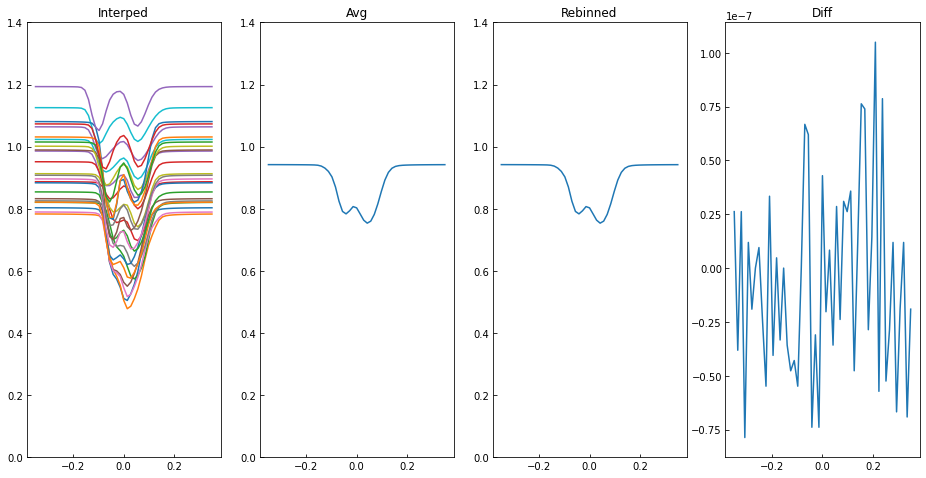

In [14]:
row_slice = slice(0,4,1)
col_slice = slice(0,4,1)
plot_constituent_same_panel(hrt_interp/ic, hrt_data/ic, row_slice, col_slice, [0,0], stokes = 0, title = ["Interped",'Rebinned'])

25


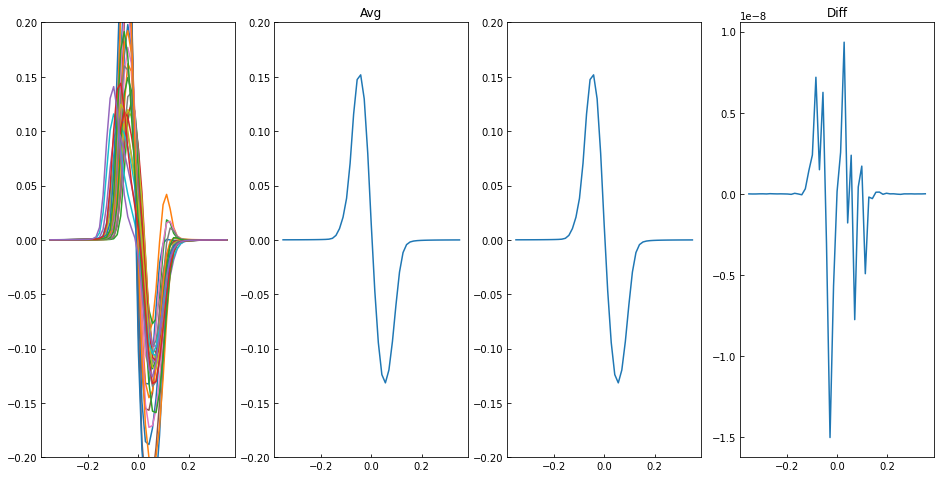

In [15]:
row_slice = slice(0,4,1)
col_slice = slice(0,4,1)
plot_constituent_same_panel(hrt_interp/ic, hrt_data/ic, row_slice, col_slice, [0,0], stokes = 3, title = None)

In [16]:
row_slice.start

0

# Compare FDT with HMI

4


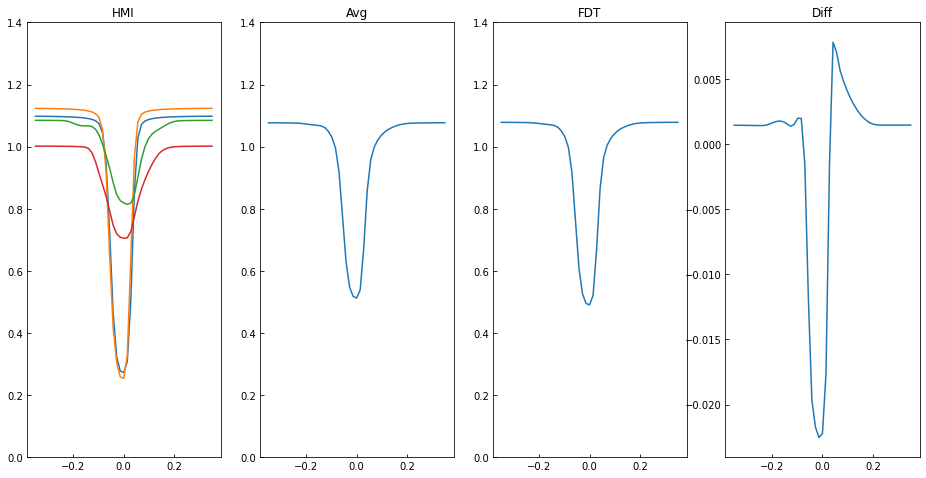

In [17]:
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
plot_constituent_same_panel(hmi_data/ic, fdt_data/ic, row_slice, col_slice, [0,0], stokes = 0, title = ["HMI",'FDT'])

4


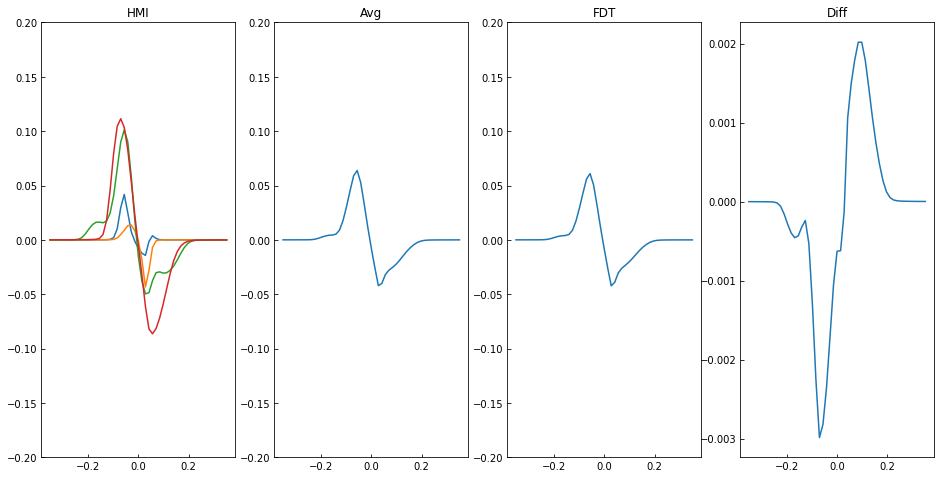

In [18]:
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
plot_constituent_same_panel(hmi_data/ic, fdt_data/ic, row_slice, col_slice, [0,0], stokes = 3, title = ["HMI",'FDT'])

In [19]:
288/59

4.88135593220339

25


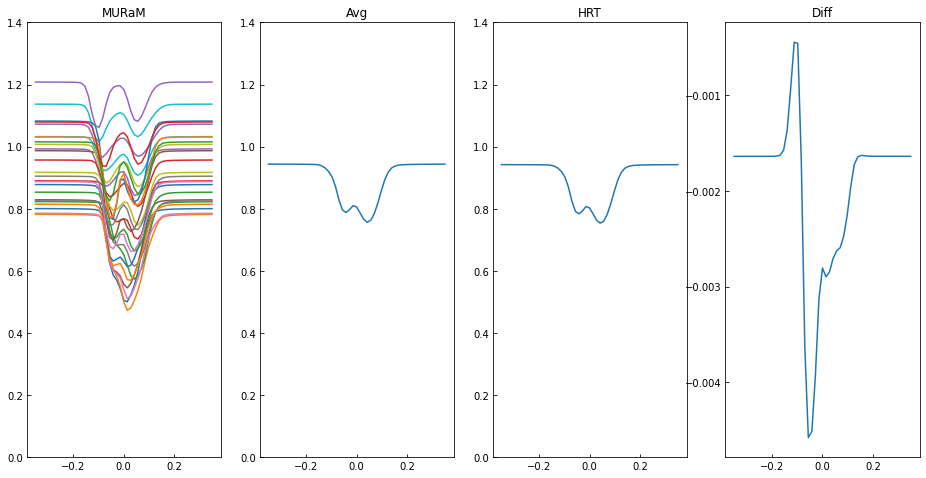

In [20]:
row_slice = slice(0,4,1)
col_slice = slice(0,4,1)
plot_constituent_same_panel(muram_data/ic, hrt_data/ic, row_slice, col_slice, [0,0], stokes = 0, title = ["MURaM",'HRT'])

25


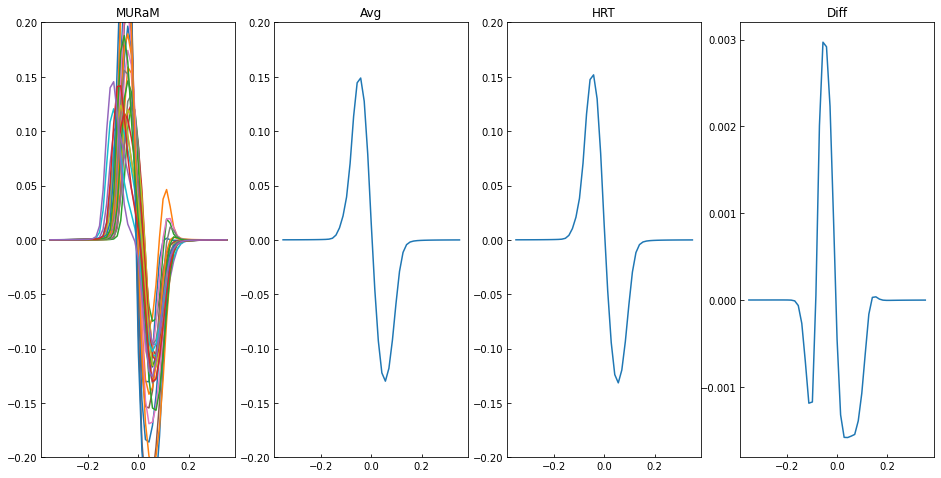

In [21]:
row_slice = slice(0,4,1)
col_slice = slice(0,4,1)
plot_constituent_same_panel(muram_data/ic, hrt_data/ic, row_slice, col_slice, [0,0], stokes = 3, title = ["MURaM",'HRT'])

16


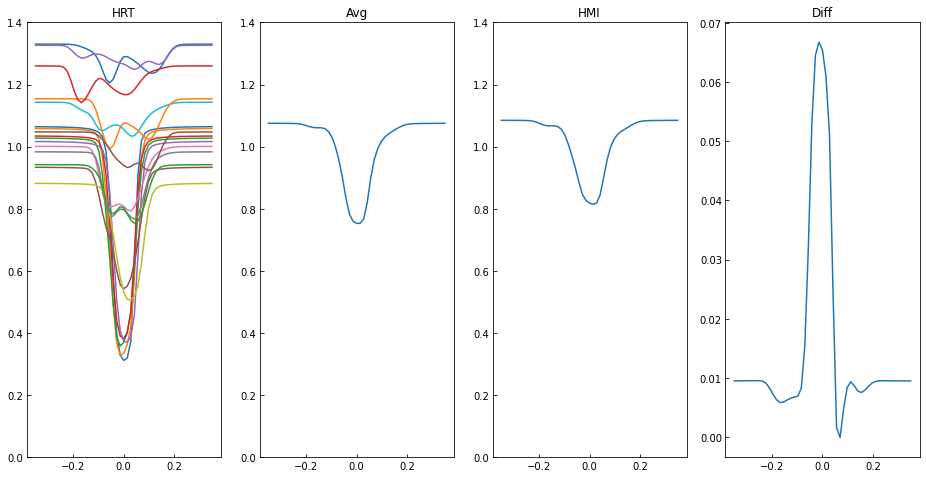

In [22]:
row_slice = slice(0,3,1)
col_slice = slice(0,3,1)
plot_constituent_same_panel(hrt_data/ic, hmi_data/ic, row_slice, col_slice, [0,0], stokes = 0, title = ["HRT",'HMI'])

16


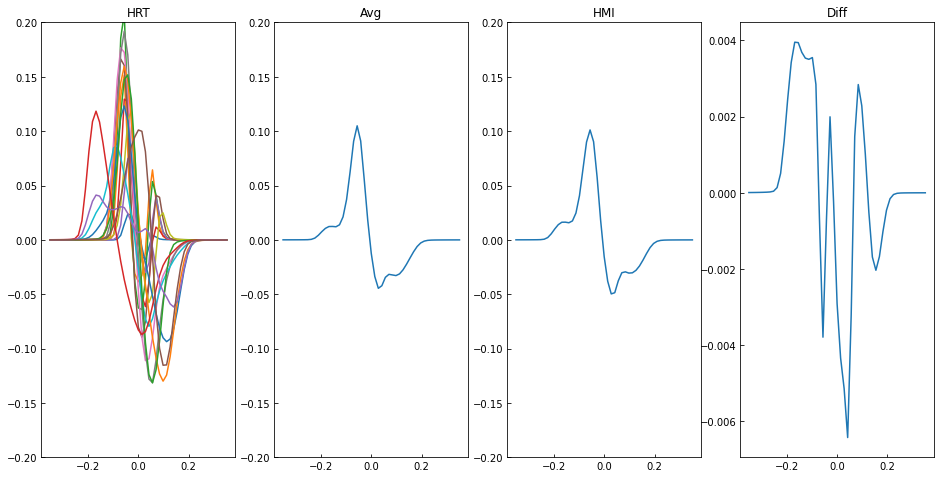

In [23]:
row_slice = slice(0,3,1)
col_slice = slice(0,3,1)
plot_constituent_same_panel(hrt_data/ic, hmi_data/ic, row_slice, col_slice, [0,0], stokes = 3, title = ["HRT",'HMI'])

In [24]:
17/8

2.125

- now retrieve the Blos values for the left panel and avg - put in the second panel in a textbox
- retrieve the blos values for the 3rd panel
- put that value in a text panel, and the diff blos in the diff panel

In [16]:
def plot_constituent_same_panel_w_blos(data_con, data, blos_con, blos, row_slice, col_slice, loc, stokes = 0, title = None):
    #row_slice, col_slice = get_indices_of_constituent_pixels(loc,data,data_con,inst_res,inst_con_res)
    size = int(row_slice.stop-row_slice.start+1)
    print(size*size)
    plt.figure(figsize=(16,16))
    wv = np.linspace(-0.35,0.35,51)
    plt.subplot(221)
    tmp = np.zeros((51))
    tmp_blos = []
    for i in range(size*size):
        row =  row_slice.stop - i//size
        col =  col_slice.start + i%size
        if blos_con[row,col] > 2000:
            plt.plot(wv,data_con[row,col,stokes,100:151], label = f"{blos_con[row,col]:.1f}")
        tmp += data_con[row,col,stokes,100:151]
        tmp_blos.append(blos_con[row,col])
    round_blos = [round(blos,1) for blos in tmp_blos]
    #plt.legend(loc="upper right")
    print(round_blos)
    print(f"Std: {np.std(tmp_blos):.1f}")
    if title is not None:
        plt.title(f"{title[0]}")
    plt.legend()
    if stokes == 0:
        plt.ylim(0,1.7)
    #elif stokes == 3:
        #plt.ylim(-0.2,0.2)
        
    plt.subplot(222)
    plt.title("Avg")
    plt.plot(wv, tmp/(size*size))
    
    if stokes == 0:
        plt.ylim(0,1.7)
    elif stokes == 3:
        plt.ylim(-0.2,0.2)
    y = 0.1*(plt.ylim()[1]-plt.ylim()[0])+plt.ylim()[0]
    plt.text(-0.34,y,r"$\langle B_{LOS} \rangle$ = "+f"{np.mean(tmp_blos):.1f} G", fontsize=20)
    
    plt.subplot(223)
    plt.plot(wv,data[loc[0],loc[1],stokes,100:151])
    if title is not None:
        plt.title(f"{title[1]}")
    if stokes == 0:
        plt.ylim(0,1.7)
    elif stokes == 3:
        plt.ylim(-0.2,0.2)
    y = 0.1*(plt.ylim()[1]-plt.ylim()[0])+plt.ylim()[0]
    plt.text(-0.34,y,r"$B_{LOS}$ = "+f"{blos[loc[0],loc[1]]:.1f} G", fontsize=20)
        
    plt.subplot(224)
    plt.plot(wv,data[loc[0],loc[1],stokes,100:151]-tmp/(size*size))
    plt.title("Diff")
    y = 0.1*(plt.ylim()[1]-plt.ylim()[0])+plt.ylim()[0]
    plt.text(-0.35,y,r"$B_{LOS}^{diff}$ = "+f"{np.mean(tmp_blos)-blos[loc[0],loc[1]]:.1f} G", fontsize=20)
#     if stokes == 0:
#         plt.ylim(0,1.4)
#     elif stokes == 3:
#         plt.ylim(-0.2,0.2)
        
    plt.show()

In [26]:
np.mean(hmi_blos)

172.32906949887217

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


64
Std: 171.1


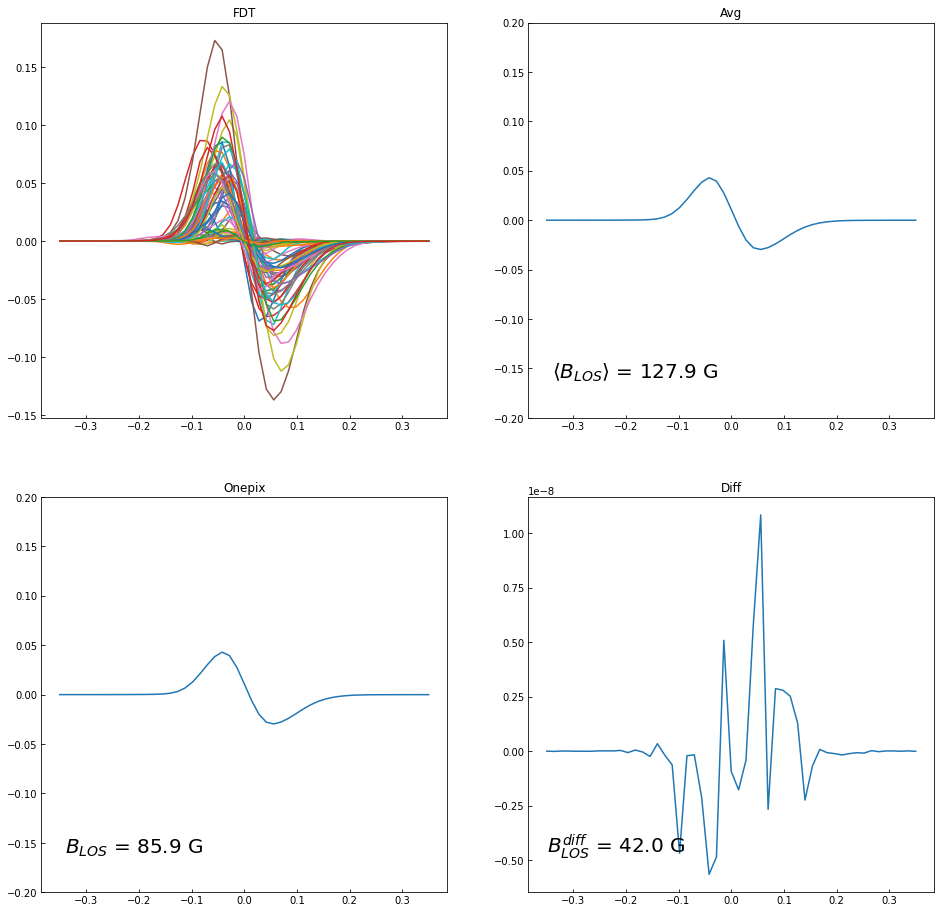

In [27]:
row_slice = slice(0,7,1)
col_slice = slice(0,7,1)
plot_constituent_same_panel_w_blos(fdt_data/ic, one_data/ic, fdt_blos, one_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["FDT",'Onepix'])

64
Std: 171.1


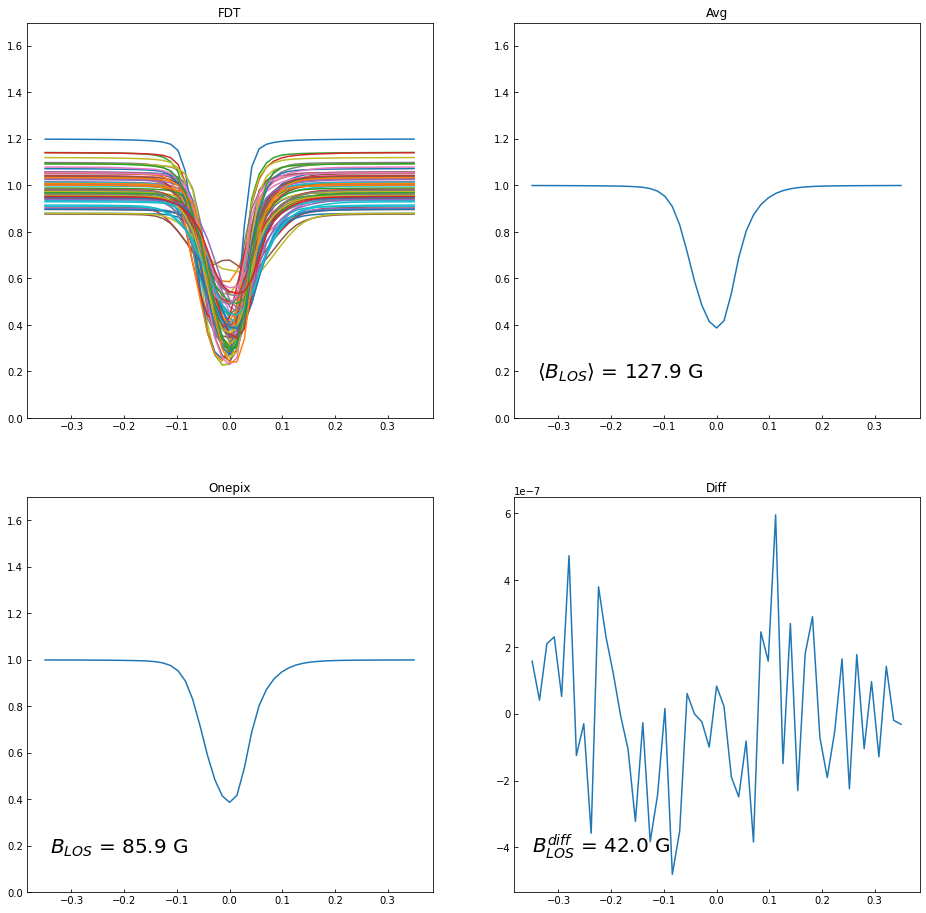

In [28]:
row_slice = slice(0,7,1)
col_slice = slice(0,7,1)
plot_constituent_same_panel_w_blos(fdt_data/ic, one_data/ic, fdt_blos, one_blos, row_slice, col_slice, [0,0], \
                            stokes = 0, title = ["FDT",'Onepix'])

4
Std: 255.6


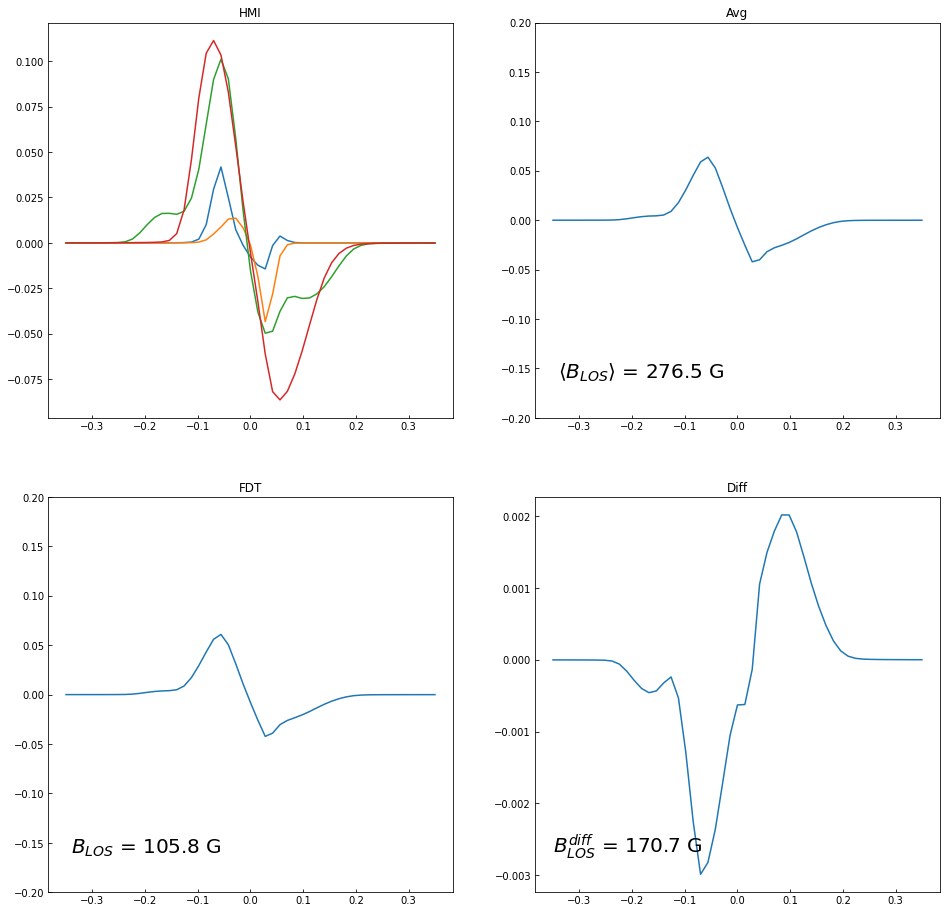

In [29]:
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
plot_constituent_same_panel_w_blos(hmi_data/ic, fdt_data/ic, hmi_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["HMI",'FDT'])

9
Std: 677.0


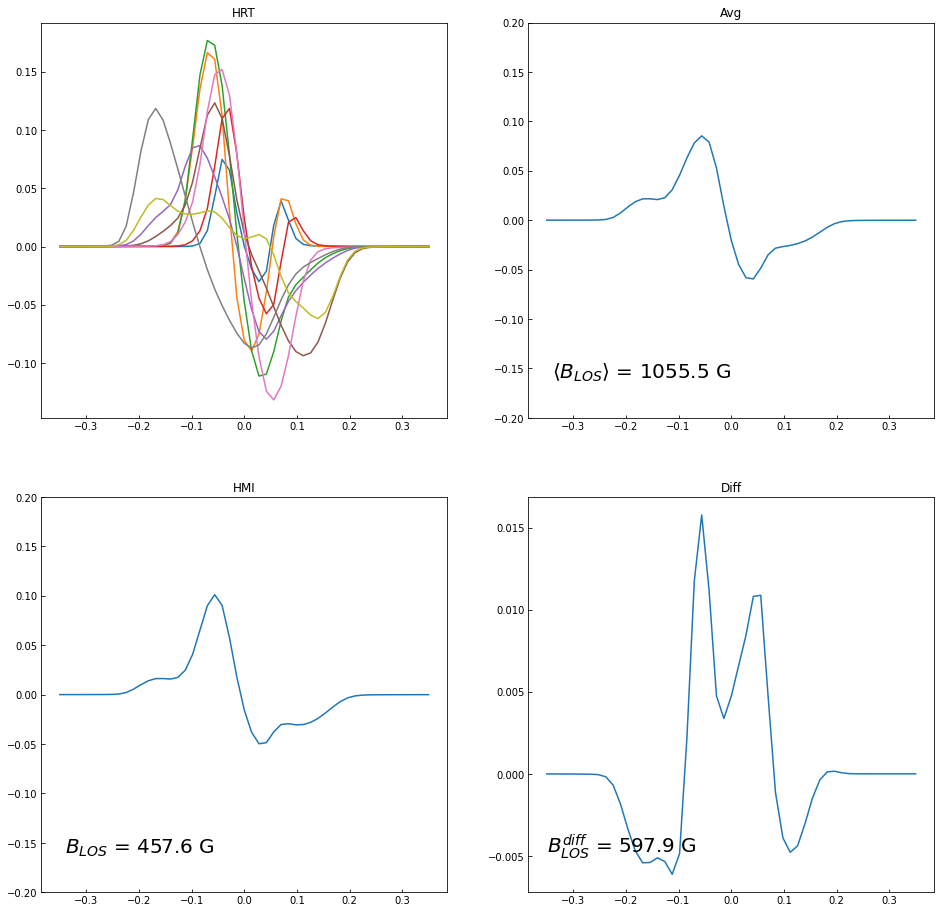

In [30]:
row_slice = slice(0,2,1)
col_slice = slice(0,2,1)
plot_constituent_same_panel_w_blos(hrt_data/ic, hmi_data/ic, hrt_blos, hmi_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["HRT",'HMI'])

25
Std: 347.8


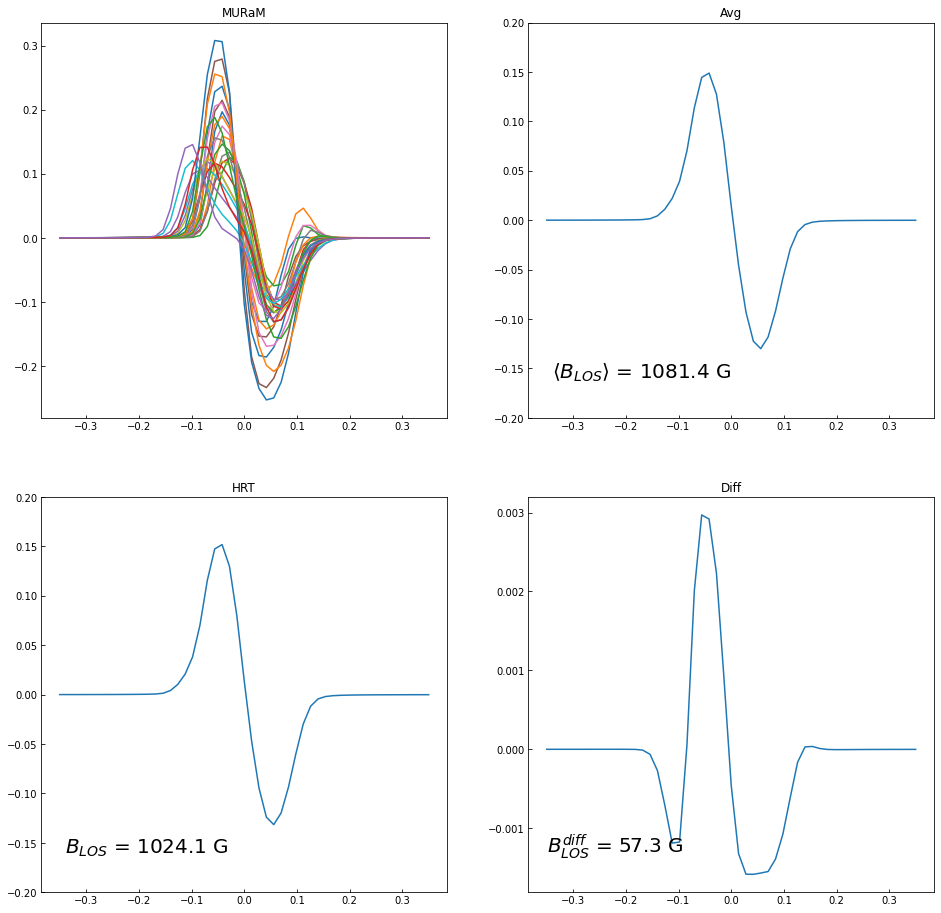

In [31]:
row_slice = slice(0,4,1)
col_slice = slice(0,4,1)
plot_constituent_same_panel_w_blos(muram_data/ic, hrt_data/ic, muram_blos, hrt_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["MURaM",'HRT'])

# do all for one fdt pixel

In [32]:
761.5/20.83333

36.55200584832094

In [33]:
row_slice.stop

4

In [34]:
test = np.linspace(0,1,50)

In [35]:
36*36

1296

1296
[15.2, 15.7, 16.0, 16.2, 16.1, 16.0, 15.8, 15.0, 13.5, 11.5, 9.7, 8.0, 6.3, 4.7, 3.2, 1.6, 0.1, -1.8, -2.7, -3.7, -4.4, -4.5, -4.5, -4.6, -4.3, -4.2, -2.7, -0.6, 1.5, 4.7, 8.4, 11.0, 11.7, 12.0, 12.8, 14.2, 16.1, 16.7, 17.3, 17.5, 17.3, 17.3, 17.0, 16.0, 14.6, 13.0, 11.2, 9.8, 7.8, 6.3, 5.4, 4.0, 2.3, 0.3, -1.4, -2.7, -3.5, -4.0, -4.5, -4.4, -4.5, -3.3, -1.6, 0.4, 2.4, 5.8, 9.6, 11.9, 13.2, 14.4, 15.9, 17.1, 17.4, 18.2, 18.8, 18.9, 18.9, 18.4, 17.8, 16.9, 15.6, 14.4, 12.7, 11.3, 9.7, 8.9, 8.3, 6.9, 4.6, 2.5, 0.5, -1.2, -2.6, -3.5, -3.6, -3.9, -3.1, -1.8, -0.3, 1.2, 3.7, 6.8, 10.2, 12.7, 15.4, 17.5, 18.7, 19.0, 18.7, 19.5, 19.8, 20.0, 19.6, 19.1, 18.7, 17.9, 16.7, 16.0, 14.3, 12.8, 11.5, 11.3, 10.9, 9.5, 7.5, 5.3, 3.2, 1.4, -0.3, -1.4, -2.0, -2.0, -1.5, -0.6, 0.6, 2.2, 5.4, 8.3, 11.0, 14.5, 17.6, 20.5, 21.6, 21.4, 19.9, 20.5, 21.1, 20.7, 20.5, 19.7, 19.1, 18.4, 17.3, 16.3, 15.3, 14.3, 13.4, 13.2, 13.1, 12.5, 9.7, 7.5, 5.1, 3.3, 1.7, 0.7, 0.3, 0.2, 0.3, 1.3, 2.5, 5.2, 7.9, 10.1, 12.

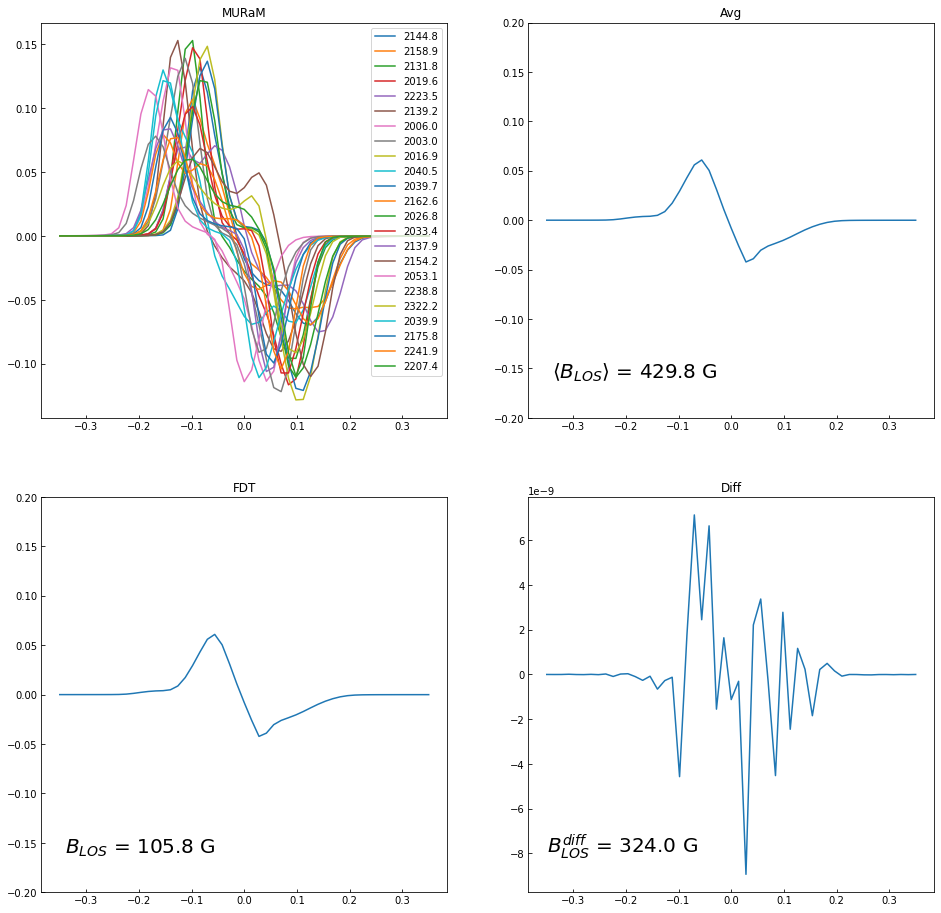

In [83]:
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
plot_constituent_same_panel_w_blos(muram_data/ic, fdt_data/ic, muram_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["MURaM",'FDT'])

In [37]:
761.5/101.5

7.502463054187192

49
[19.9, 17.8, 13.5, 8.3, 1.0, 4.2, 16.3, 18.9, 14.3, 17.8, 25.0, 19.7, 17.9, 24.5, 15.2, 18.5, 33.0, 40.3, 39.9, 34.8, 35.4, 18.0, 73.7, 160.2, 137.0, 68.8, 57.7, 48.7, 45.4, 374.3, 948.9, 995.6, 410.8, 238.9, 177.1, 224.4, 1375.2, 1857.5, 1618.9, 1421.7, 1149.1, 1020.4, 1024.1, 1890.9, 1758.6, 1159.1, 1216.1, 1318.9, 863.1]
Std: 603.1


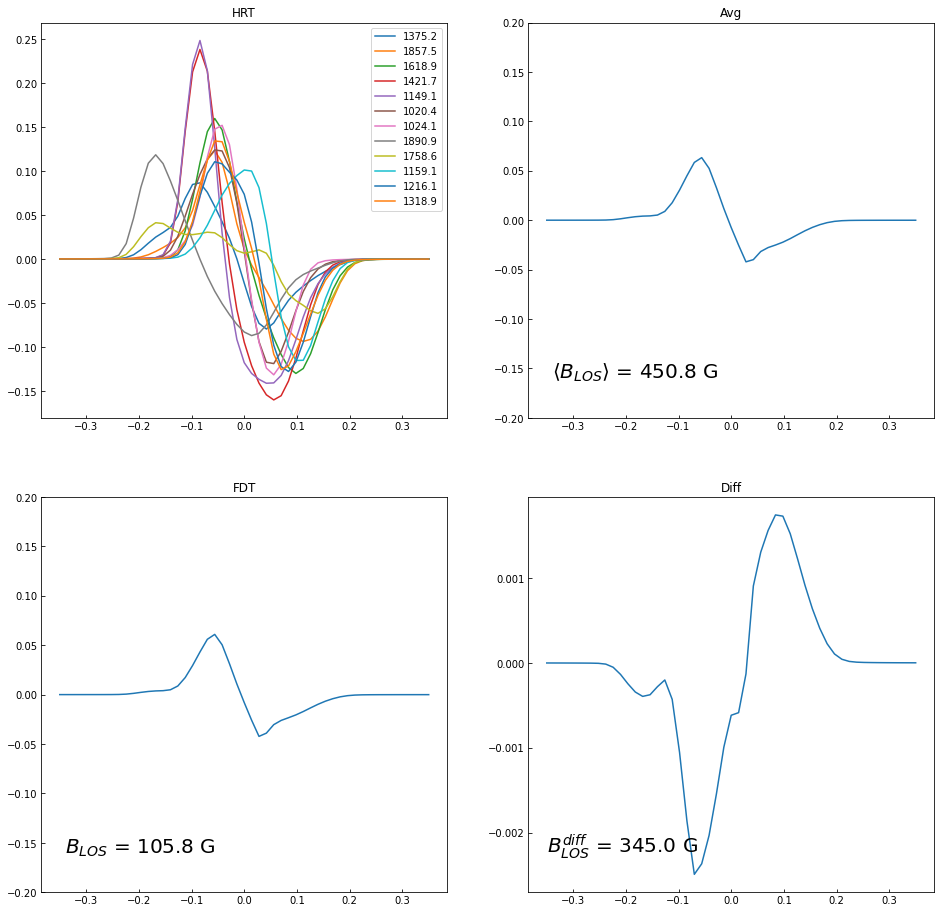

In [78]:
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
plot_constituent_same_panel_w_blos(hrt_data/ic, fdt_data/ic, hrt_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["HRT",'FDT'])

In [39]:
761.5/362.5

2.1006896551724137

4
Std: 255.6


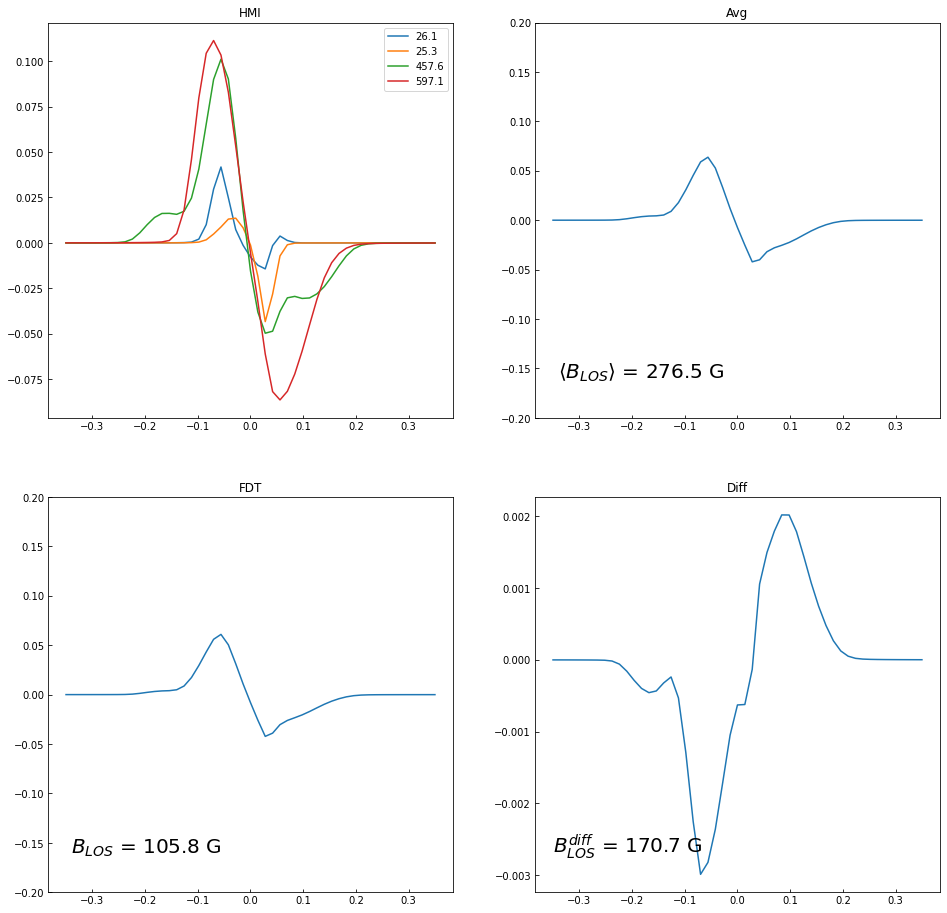

In [71]:
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
plot_constituent_same_panel_w_blos(hmi_data/ic, fdt_data/ic, hmi_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 3, title = ["HMI",'FDT'])

1296
Std: 620.3


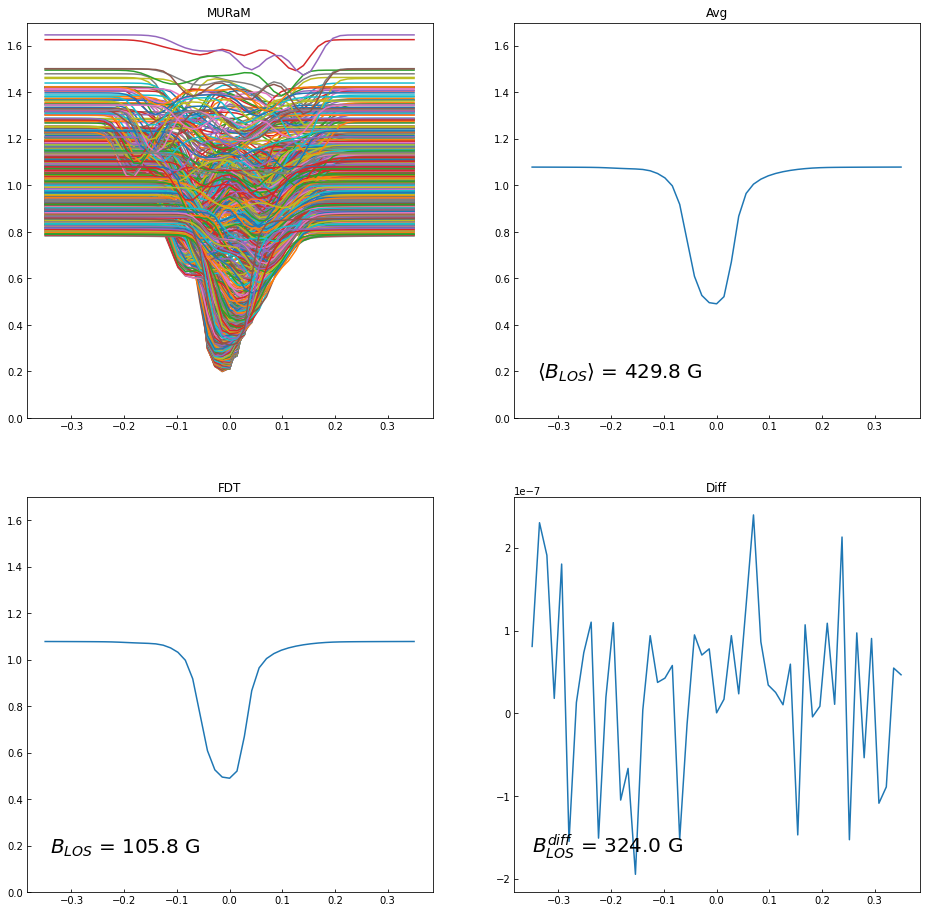

In [41]:
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
plot_constituent_same_panel_w_blos(muram_data/ic, fdt_data/ic, muram_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 0, title = ["MURaM",'FDT'])

49
Std: 603.1


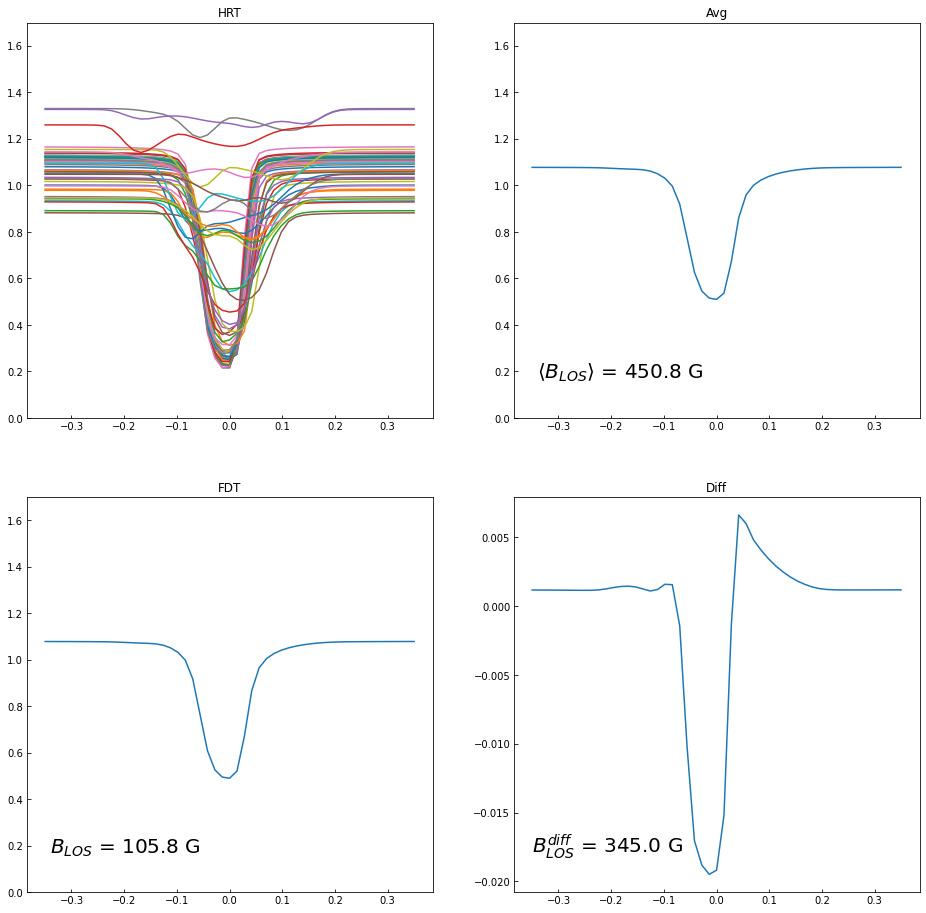

In [42]:
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
plot_constituent_same_panel_w_blos(hrt_data/ic, fdt_data/ic, hrt_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 0, title = ["HRT",'FDT'])

4
Std: 255.6


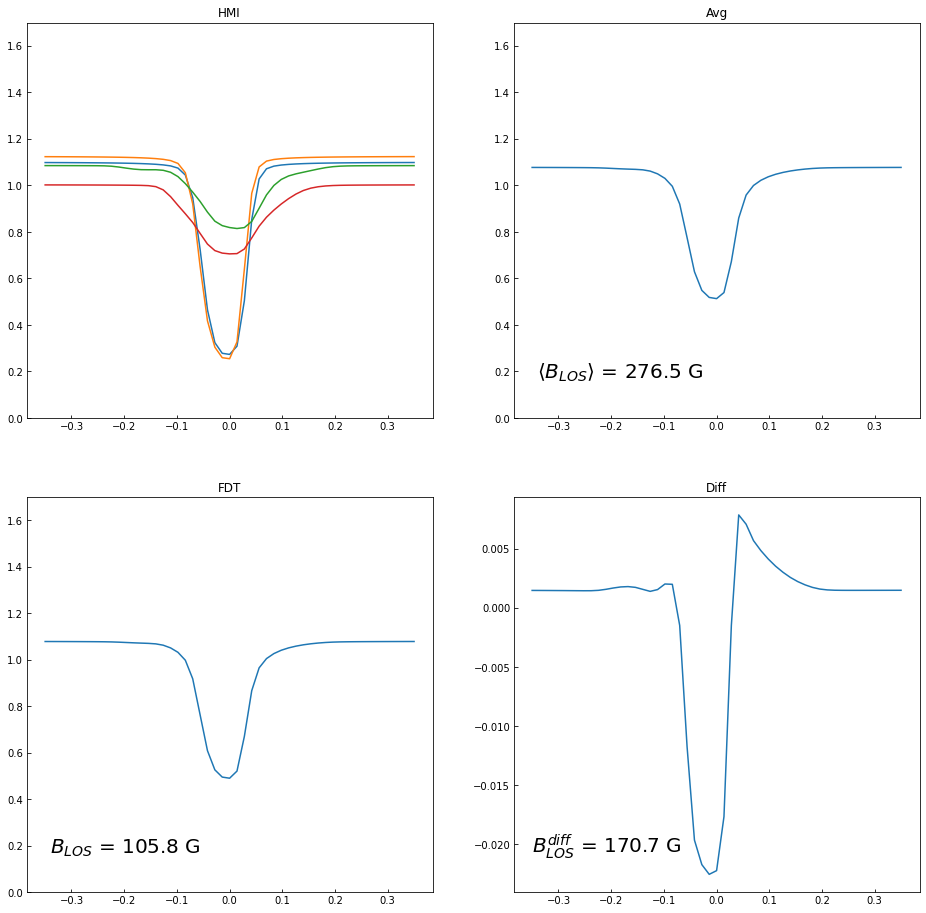

In [43]:
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
plot_constituent_same_panel_w_blos(hmi_data/ic, fdt_data/ic, hmi_blos, fdt_blos, row_slice, col_slice, [0,0], \
                            stokes = 0, title = ["HMI",'FDT'])

In [37]:
def overplot_stokes(ax, stokes_data, blos, stokes_param, row_slice, col_slice, show_avg=True, text=None, xlabel=None, ylabel=None, vmax = 0.45, imax=1.8):
    size = int(row_slice.stop-row_slice.start+1)
    print(size*size)
    wv = np.linspace(-0.35,0.35,51)
    tmp = np.zeros((51))
    tmp_blos = []
    for i in range(size*size):
        row =  row_slice.stop - i//size
        col =  col_slice.start + i%size
        if size ==1:
            ax.plot(wv,stokes_data[row,col,stokes_param,100:151],color='black')
        else:
            ax.plot(wv,stokes_data[row,col,stokes_param,100:151])
        tmp += stokes_data[row,col,stokes_param,100:151]
        tmp_blos.append(blos[row,col])
    round_blos = np.array([round(blos,1) for blos in tmp_blos])
    if show_avg:
        ax.plot(wv, tmp/(size*size), label='Avg.', linewidth=3.0, color='black')
        ax.legend(loc="upper right")
    if stokes_param == 0:
        ax.set_ylim(0,imax)
    elif stokes_param == 3:
        ax.set_ylim(-vmax,vmax)
    ylims = ax.get_ylim()
    xlims = ax.get_xlim()
    t = ax.text(0.65*(xlims[1]-xlims[0])+xlims[0],0.05*(ylims[1]-ylims[0])+ylims[0], s = r'$\langle B_{LOS} \rangle$ = ' + f'{np.mean(round_blos):.0f} G')
    t.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='white'))
    
    if text is not None:
        t1 = ax.text(0.15*(xlims[1]-xlims[0])+xlims[0],0.05*(ylims[1]-ylims[0])+ylims[0], s = f'{text}')
        t1.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='white'))
        
    if xlabel is not None:
        ax.set_xlabel(f"{xlabel}")
        
    if ylabel is not None:
        ax.set_ylabel(f"{ylabel}")
        
    if show_avg:
        return tmp/(size*size)
    else:
        return stokes_data[row,col,stokes_param,100:151]

In [22]:
max(abs(np.array((0,2))))

2

In [38]:
def plot_diff(ax, avg_profs, ref_prof, stokes_param, labels, text=None, xlabel=None, ylabel=None):
    wv = np.linspace(-0.35,0.35,51)
    if isinstance(ref_prof,list):
        assert len(ref_prof) == len(avg_profs)
        i = 0
        for prof,lbl in zip(avg_profs,labels):
            ax.plot(wv, (prof-ref_prof[i]), label=lbl)
            i += 1
    else:
        for prof,lbl in zip(avg_profs,labels):
            ax.plot(wv, (prof-ref_prof), label=lbl)
    ax.legend(loc="upper right")
    ylims = ax.get_ylim()
    xlims = ax.get_xlim()
    max_y = max(abs(np.array(ylims)))
    ax.set_ylim(-max_y,max_y)
    ylims = ax.get_ylim()
    if text is not None:
        t1 = ax.text(0.15*(xlims[1]-xlims[0])+xlims[0],0.05*(ylims[1]-ylims[0])+ylims[0], s = f'{text}', fontsize=15)
        t1.set_bbox(dict(facecolor='white', alpha=0.8, edgecolor='white'))
        
    if xlabel is not None:
        ax.set_xlabel(f"{xlabel}")
        
    if ylabel is not None:
        ax.set_ylabel(f"{ylabel}")

1296
1296
49
49
4
4
1
1


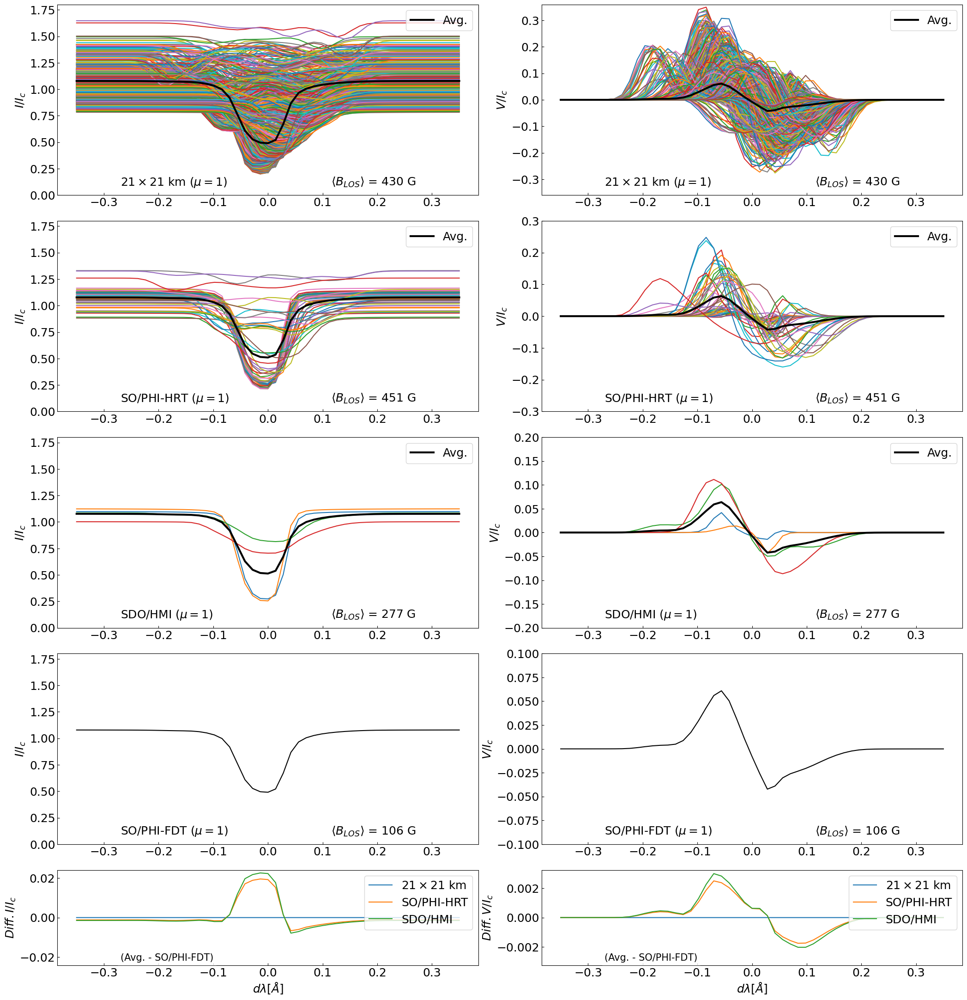

In [49]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,27))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,0.5])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax=0.36)

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
hrt_I = overplot_stokes(ax3, hrt_data/ic, hrt_blos, 0, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data/ic, hrt_blos, 3, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax = 0.3)

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
hmi_I = overplot_stokes(ax5, hmi_data/ic, hmi_blos, 0, row_slice, col_slice, text=r'SDO/HMI ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data/ic, hmi_blos, 3, row_slice, col_slice, text=r'SDO/HMI ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax = 0.2)

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax=0.1)

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])
plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. V/I_c$")

plt.savefig('./plots/mu_1_profiles.png', bbox_inches='tight', dpi=300)
plt.show()

1296
1296
49
49
4
4
1
1


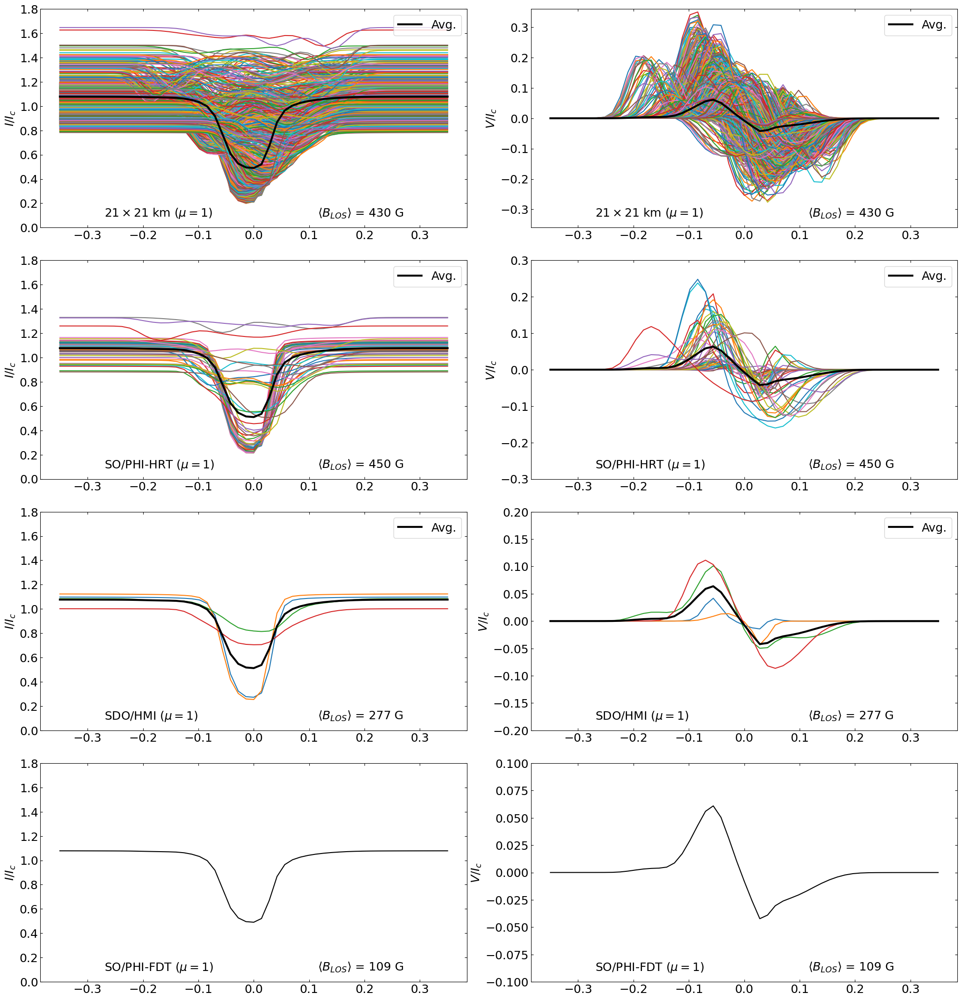

In [40]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,27))

gs2 = GridSpec(4, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$I/I_c$")
ax.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax=0.36)
ax2.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
hrt_I = overplot_stokes(ax3, hrt_data/ic, hrt_blos, 0, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=1$)', \
                ylabel = r"$I/I_c$")
ax3.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data/ic, hrt_blos, 3, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax = 0.3)
ax4.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
hmi_I = overplot_stokes(ax5, hmi_data/ic, hmi_blos, 0, row_slice, col_slice, text=r'SDO/HMI ($\mu=1$)', \
                ylabel = r"$I/I_c$")
ax5.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data/ic, hmi_blos, 3, row_slice, col_slice, text=r'SDO/HMI ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax = 0.2)
ax6.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$I/I_c$")
ax7.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$V/I_c$", vmax=0.1)
ax8.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

# avg_profs_I = [muram_I, hrt_I, hmi_I]
# avg_profs_V = [muram_V, hrt_V, hmi_V]
# labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

# ax9 = fig.add_subplot(gs2[4, 0])
# row_slice = slice(0,0,1)
# col_slice = slice(0,0,1)
# plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
#                 xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. I/I_c$")

# ax10 = fig.add_subplot(gs2[4, 1])
# plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
#                 xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. V/I_c$")

plt.savefig('./plots/mu_1_profiles_nodiff_qu_1551_ticks.png', bbox_inches='tight', dpi=300)
plt.show()

In [48]:
4/4.51

0.8869179600886918

In [49]:
49/54

0.9074074074074074

1296
1296
49
49
4
4
1
1


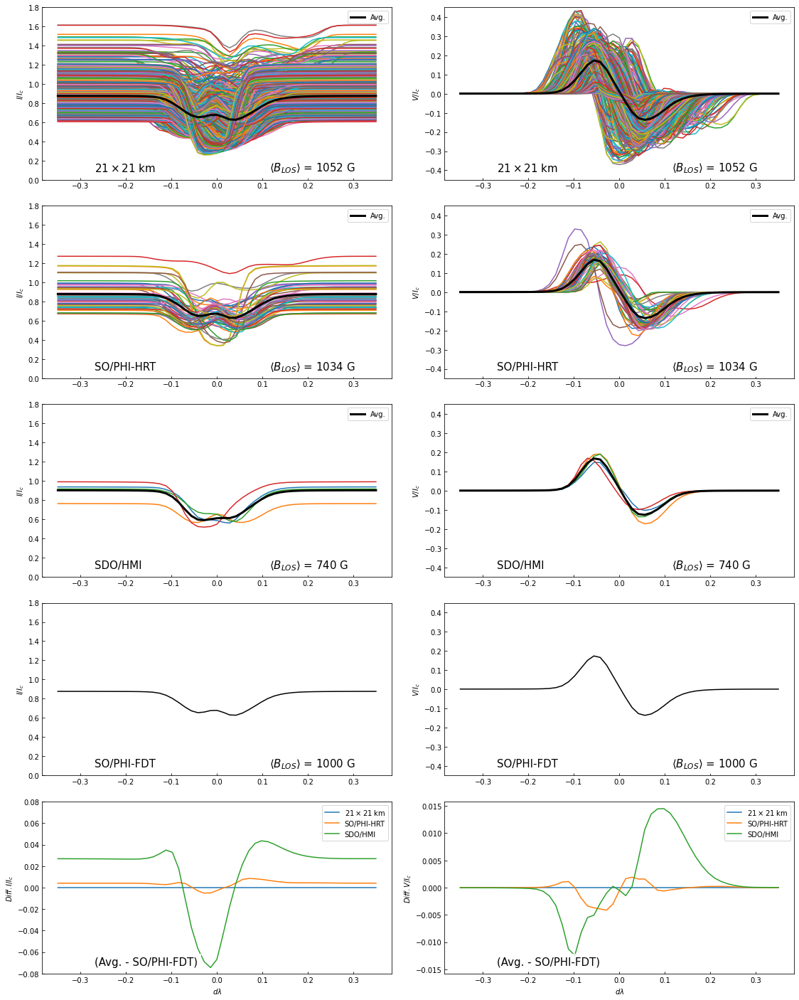

In [50]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(15,25))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(144,179,1)
col_slice = slice(36,71,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$I/I_c$")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$V/I_c$")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(30,36,1)
col_slice = slice(7,13,1)
hrt_I = overplot_stokes(ax3, hrt_data/ic, hrt_blos, 0, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$I/I_c$")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data/ic, hrt_blos, 3, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$V/I_c$")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(8,9,1)
col_slice = slice(2,3,1)
hmi_I = overplot_stokes(ax5, hmi_data/ic, hmi_blos, 0, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$I/I_c$")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data/ic, hmi_blos, 3, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$V/I_c$")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(4,4,1)
col_slice = slice(1,1,1)
fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$I/I_c$")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$V/I_c$")

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])
plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda$', ylabel = r"$Diff. V/I_c$")

plt.show()

In [51]:
36*4

144

In [52]:
7*4

28

1296
1296
49
49
4
4
1
1


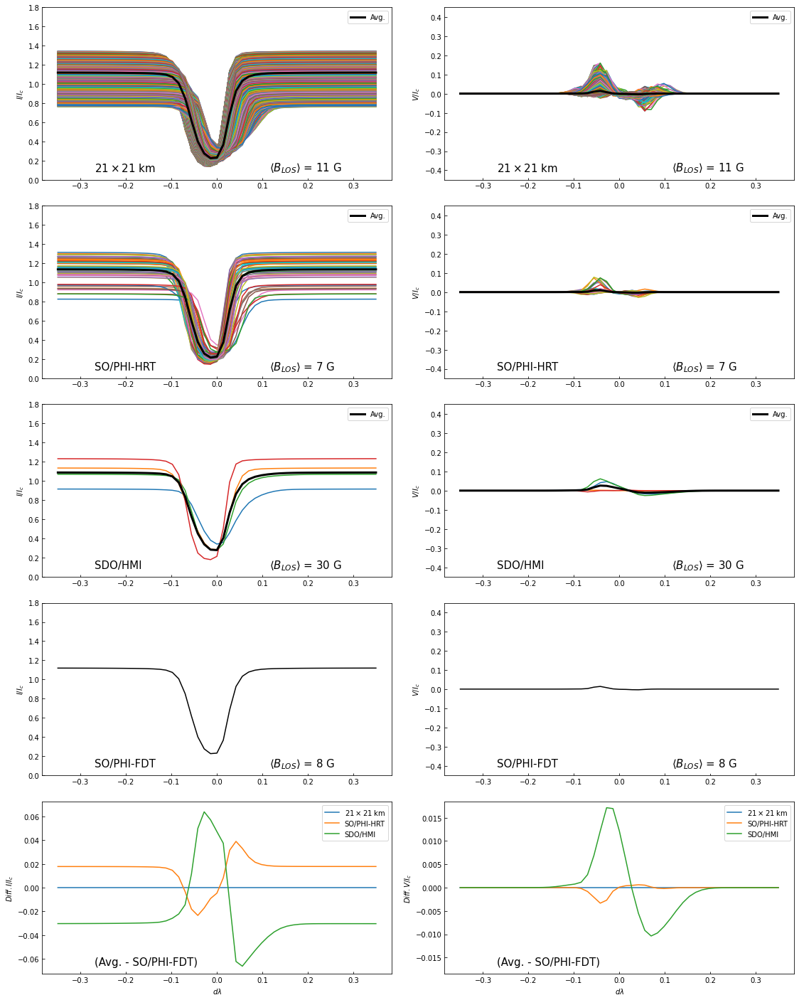

In [53]:


fig = plt.figure(figsize=(15,25))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(180,215,1)
col_slice = slice(72,107,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$I/I_c$")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$V/I_c$")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(37,43,1)
col_slice = slice(15,21,1)
hrt_I = overplot_stokes(ax3, hrt_data/ic, hrt_blos, 0, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$I/I_c$")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data/ic, hrt_blos, 3, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$V/I_c$")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(11,12,1)
col_slice = slice(4,5,1)
hmi_I = overplot_stokes(ax5, hmi_data/ic, hmi_blos, 0, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$I/I_c$")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data/ic, hmi_blos, 3, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$V/I_c$")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(5,5,1)
col_slice = slice(2,2,1)
fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$I/I_c$")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$V/I_c$")

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])
plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda$', ylabel = r"$Diff. V/I_c$")

plt.show()

In [54]:
5*7.4

37.0

In [55]:
36*5

180

In [56]:
180+35

215

In [57]:
72+35

107

In [58]:
2.125*5

10.625

1296
1296
49
49
4
4
1
1


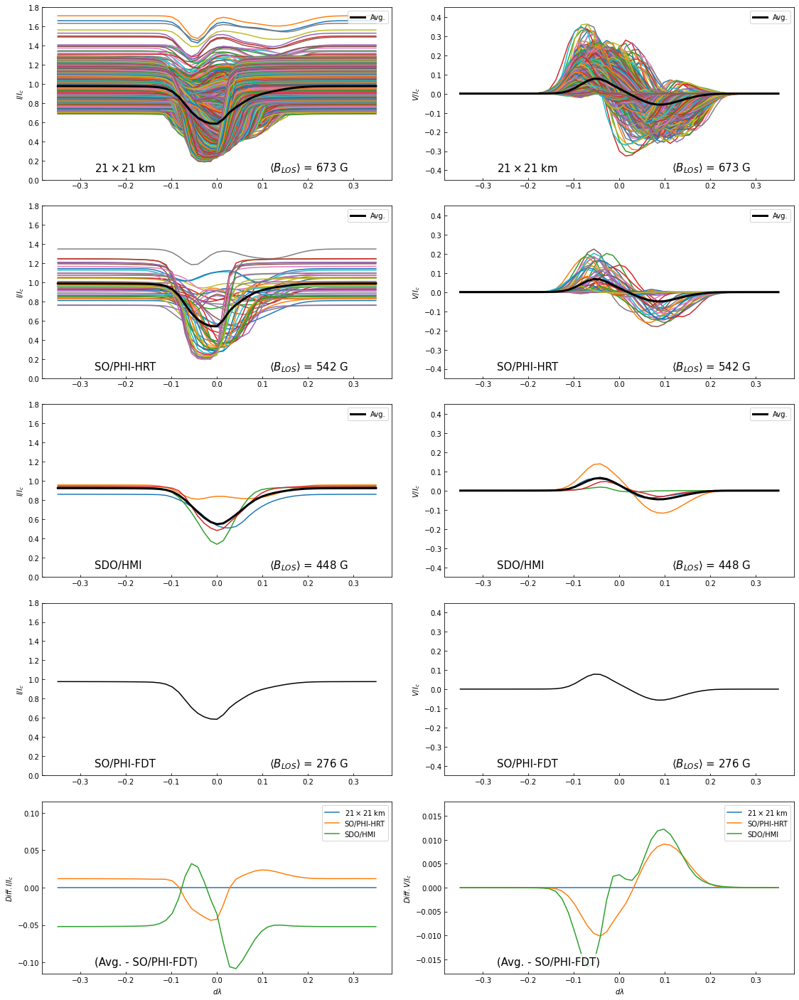

In [59]:
fig = plt.figure(figsize=(15,25))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(216,251,1)
col_slice = slice(108,143,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$I/I_c$")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km', \
                ylabel = r"$V/I_c$")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(44,50,1)
col_slice = slice(22,28,1)
hrt_I = overplot_stokes(ax3, hrt_data/ic, hrt_blos, 0, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$I/I_c$")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data/ic, hrt_blos, 3, row_slice, col_slice, text=r'SO/PHI-HRT', \
                ylabel = r"$V/I_c$")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(13,14,1)
col_slice = slice(6,7,1)
hmi_I = overplot_stokes(ax5, hmi_data/ic, hmi_blos, 0, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$I/I_c$")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data/ic, hmi_blos, 3, row_slice, col_slice, text=r'SDO/HMI', \
                ylabel = r"$V/I_c$")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(6,6,1)
col_slice = slice(3,3,1)
fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$I/I_c$")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT', \
                ylabel = r"$V/I_c$")

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])
plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda$', ylabel = r"$Diff. V/I_c$")

plt.show()

In [60]:
6*2.1

12.600000000000001

In [61]:
3*2.1

6.300000000000001

In [62]:
6*7.375

44.25

In [63]:
3*7.375

22.125

In [64]:
6*36

216

In [65]:
216+35

251

In [66]:
3*36+35

143

In [31]:
from matplotlib.gridspec import GridSpec

def plot_muram_fdt(muram_data, fdt_data, muram_blos, fdt_blos, fdt_slice):
    
    row_fdt = fdt_slice[0]
    col_fdt = fdt_slice[1]
    
    row_muram = slice(int(row_fdt.start*36),int(row_fdt.start*36+35),1)
    col_muram = slice(int(col_fdt.start*36),int(col_fdt.start*36+35),1)
    
    
    fig = plt.figure(figsize=(15,15))

    gs2 = GridSpec(3, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1])

    ax = fig.add_subplot(gs2[0, 0])
    muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_muram, col_muram, text=r'$21\times21$ km', \
                    ylabel = r"$I/I_c$")

    ax2 = fig.add_subplot(gs2[0, 1])
    muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_muram, col_muram, text=r'$21\times21$ km', \
                    ylabel = r"$V/I_c$")

    ax7 = fig.add_subplot(gs2[1, 0])
    fdt_I = overplot_stokes(ax7, fdt_data/ic, fdt_blos, 0, row_fdt, col_fdt, show_avg=False, text=r'SO/PHI-FDT', \
                    ylabel = r"$I/I_c$")

    ax8 = fig.add_subplot(gs2[1, 1])
    fdt_V = overplot_stokes(ax8, fdt_data/ic, fdt_blos, 3, row_fdt, col_fdt, show_avg=False, text=r'SO/PHI-FDT', \
                    ylabel = r"$V/I_c$")

    avg_profs_I = [muram_I]
    avg_profs_V = [muram_V]
    labels = [r'$21\times21$ km']

    ax9 = fig.add_subplot(gs2[2, 0])
    plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                    xlabel=r'$d\lambda$', ylabel = r"$Diff. I/I_c$")

    ax10 = fig.add_subplot(gs2[2, 1])
    plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                    xlabel=r'$d\lambda$', ylabel = r"$Diff. V/I_c$")

    plt.show()

In [68]:
# for ang in ['00','25_9','37','45_5','53','60','66_5','72_6','75_5','78_4','81_4']:
#     muram_data,muram_interp = get_stokes_interped_and_rebin('ngrey_200G', ang, '200000', inst='MURaM', \
#                                                     downscale_mean=False, remainder_mode='round')

#     muram_blos = get_blos_inst_pixel('ngrey_200G', ang, '200000', \
#                                0.35, inst='MURaM',downscale_mean=False, \
#                                remainder_mode='round', refwv=6173.341, \
#                                dshape=288, pixel_res=20.833333, \
#                                blos_method='CMILOS', return_mean=False)
    
#     fdt_data,fdt_interp = get_stokes_interped_and_rebin('ngrey_200G', ang, '200000', inst='FDT', \
#                                                     downscale_mean=False, remainder_mode='round')

#     fdt_blos = get_blos_inst_pixel('ngrey_200G', ang, '200000', \
#                                0.35, inst='FDT',downscale_mean=False, \
#                                remainder_mode='round', refwv=6173.341, \
#                                dshape=288, pixel_res=20.833333, \
#                                blos_method='CMILOS', return_mean=False)
    
#     plot_muram_fdt(muram_data, fdt_data, muram_blos, fdt_blos, [slice(0,0,1),slice(0,0,1)])
    

1296
1296
1
1
1296
1296
1
1


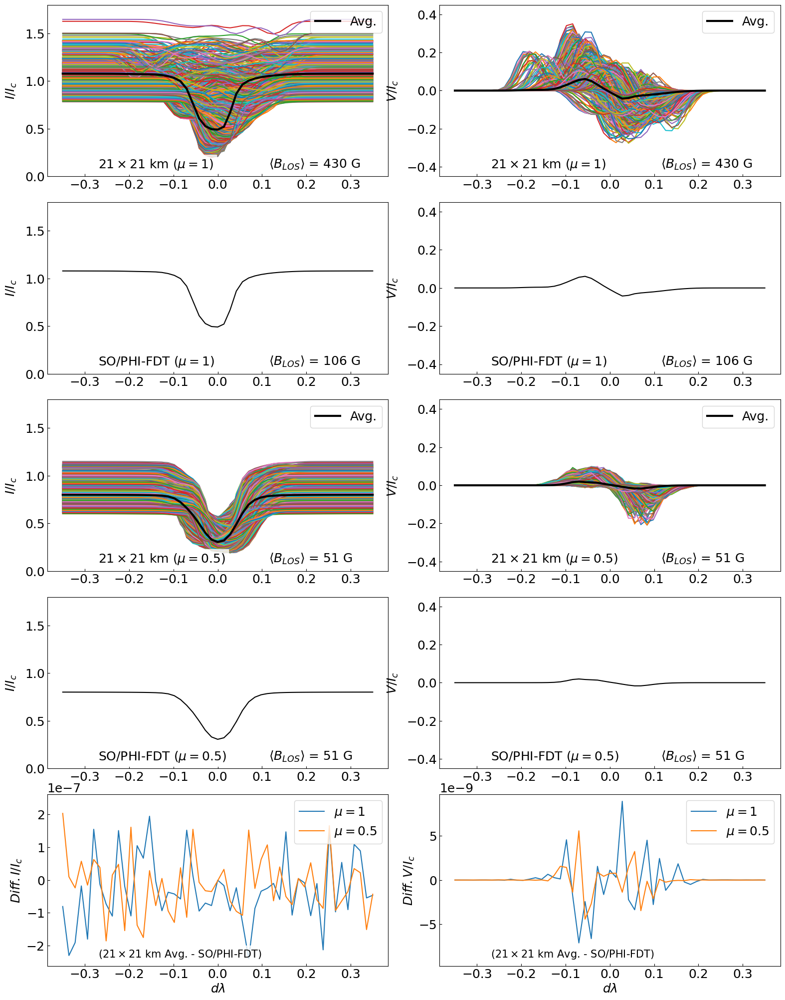

In [33]:
fig = plt.figure(figsize=(15,25))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data/ic, muram_blos, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data/ic, muram_blos, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=1$)', \
                ylabel = r"$V/I_c$")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax3, fdt_data/ic, fdt_blos, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$I/I_c$")

ax4 = fig.add_subplot(gs2[1, 1])
fdt_V = overplot_stokes(ax4, fdt_data/ic, fdt_blos, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=1$)', \
                ylabel = r"$V/I_c$")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I_60 = overplot_stokes(ax5, muram_data_60/ic, muram_blos_60, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$I/I_c$")

ax6 = fig.add_subplot(gs2[2, 1])
muram_V_60 = overplot_stokes(ax6, muram_data_60/ic, muram_blos_60, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$V/I_c$")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I_60 = overplot_stokes(ax7, fdt_data_60/ic, fdt_blos_60, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$I/I_c$")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V_60 = overplot_stokes(ax8, fdt_data_60/ic, fdt_blos_60, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$V/I_c$")

avg_profs_I = [muram_I, muram_I_60]
avg_profs_V = [muram_V, muram_V_60]
labels = [r'$\mu=1$', '$\mu=0.5$']

ax9 = fig.add_subplot(gs2[4, 0])
plot_diff(ax9, avg_profs_I, [fdt_I,fdt_I_60], 0, labels, text=r'($21\times21$ km Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])
plot_diff(ax10, avg_profs_V, [fdt_V,fdt_V_60], 3, labels, text=r'($21\times21$ km Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda$', ylabel = r"$Diff. V/I_c$")

plt.show()

1296
1296
49
49
4
4
1
1


/home/sinjan/.conda/envs/dataproc/lib/python3.7/site-packages/ipykernel_launcher.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


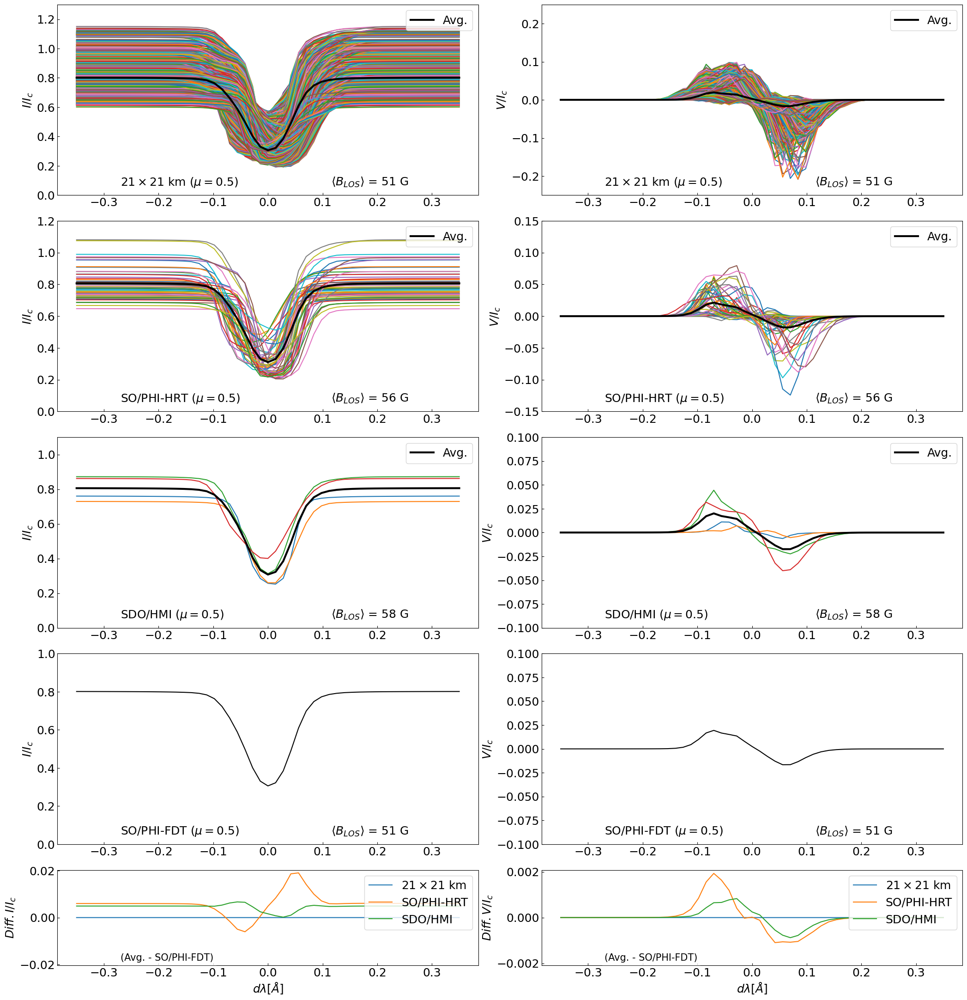

In [44]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,27))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,0.5])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data_60/ic, muram_blos_60, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.3)

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data_60/ic, muram_blos_60, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.25, imax=1)

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
hrt_I = overplot_stokes(ax3, hrt_data_60/ic, hrt_blos_60, 0, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.2)

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data_60/ic, hrt_blos_60, 3, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.15, imax=1)

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
hmi_I = overplot_stokes(ax5, hmi_data_60/ic, hmi_blos_60, 0, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.1)

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data_60/ic, hmi_blos_60, 3, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.1, imax=1)

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax7, fdt_data_60/ic, fdt_blos_60, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1)

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data_60/ic, fdt_blos_60, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.1, imax=1)

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])

plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. V/I_c$")
plt.ticklabel_format(axis='y', style='sci')
plt.tight_layout()
plt.savefig('./plots/mu_05_profiles.png', bbox_inches='tight', dpi=300)
plt.show()

1296
1296
49
49
4
4
1
1


/tmp/ipykernel_61421/1997050017.py:69: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


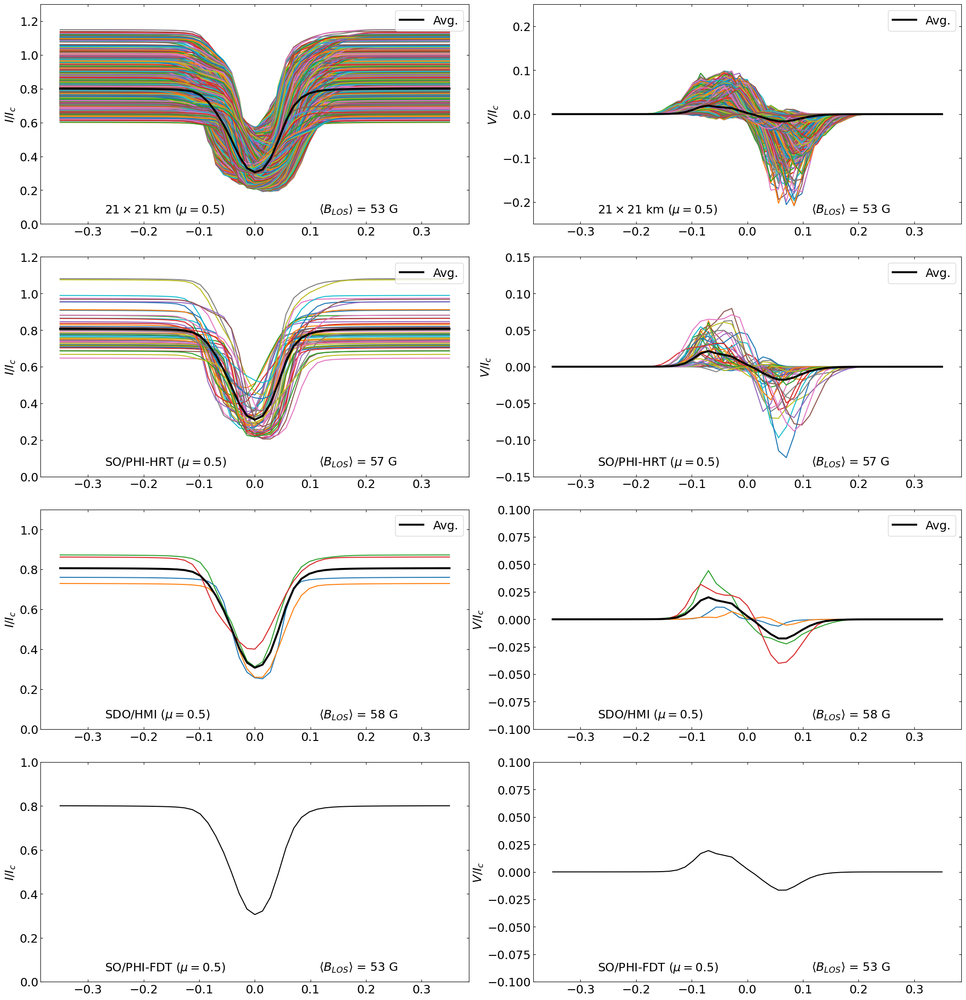

In [42]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,27))

gs2 = GridSpec(4, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data_60/ic, muram_blos_60, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.3)
ax.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data_60/ic, muram_blos_60, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.25, imax=1)
ax2.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
hrt_I = overplot_stokes(ax3, hrt_data_60/ic, hrt_blos_60, 0, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.2)
ax3.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data_60/ic, hrt_blos_60, 3, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.15, imax=1)
ax4.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
hmi_I = overplot_stokes(ax5, hmi_data_60/ic, hmi_blos_60, 0, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.1)
ax5.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data_60/ic, hmi_blos_60, 3, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.1, imax=1)
ax6.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax7, fdt_data_60/ic, fdt_blos_60, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1)
ax7.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data_60/ic, fdt_blos_60, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.5$)', \
                ylabel = r"$V/I_c$", vmax=0.1, imax=1)
ax8.tick_params(top=True, bottom=True, left=True, right=True, labeltop=False, labelbottom=True, direction="in")
# avg_profs_I = [muram_I, hrt_I, hmi_I]
# avg_profs_V = [muram_V, hrt_V, hmi_V]
# labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

# ax9 = fig.add_subplot(gs2[4, 0])
# row_slice = slice(0,0,1)
# col_slice = slice(0,0,1)
# plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
#                 xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. I/I_c$")

# ax10 = fig.add_subplot(gs2[4, 1])

# plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
#                 xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. V/I_c$")
plt.ticklabel_format(axis='y', style='sci')
plt.tight_layout()
plt.savefig('./plots/mu_05_profiles_nodiff_1551_qu_ticks.png', bbox_inches='tight', dpi=300)
plt.show()

1296
1296
49
49
4
4
1
1


/home/sinjan/.conda/envs/dataproc/lib/python3.7/site-packages/ipykernel_launcher.py:62: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.


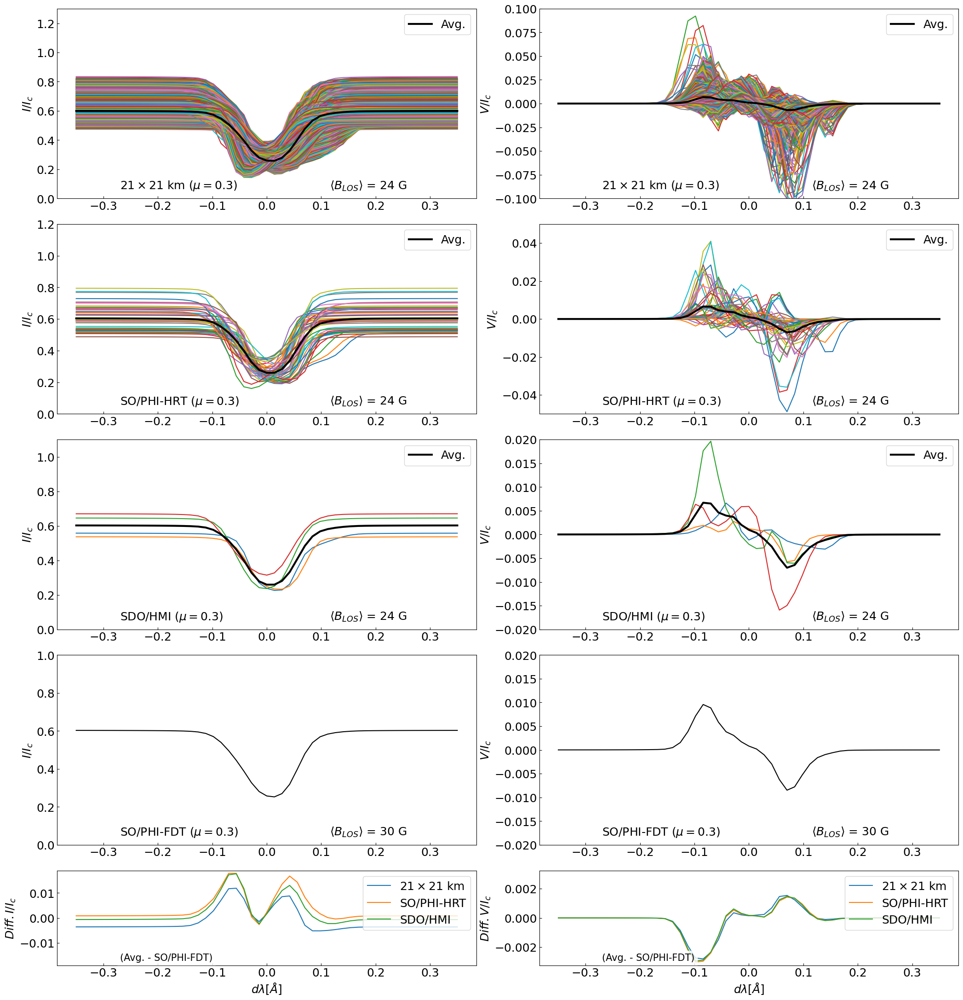

In [60]:
from matplotlib.gridspec import GridSpec

fig = plt.figure(figsize=(20,27))

gs2 = GridSpec(5, 2, left=0.01, right=0.99, hspace=0.15, wspace=0.15, height_ratios=[1,1,1,1,0.5])

ax = fig.add_subplot(gs2[0, 0])
row_slice = slice(0,35,1)
col_slice = slice(0,35,1)
muram_I = overplot_stokes(ax, muram_data_72/ic, muram_blos_72, 0, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.3$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.3)

ax2 = fig.add_subplot(gs2[0, 1])
muram_V = overplot_stokes(ax2, muram_data_72/ic, muram_blos_72, 3, row_slice, col_slice, text=r'$21\times21$ km ($\mu=0.3$)', \
                ylabel = r"$V/I_c$", vmax=0.1, imax=1)

ax3 = fig.add_subplot(gs2[1, 0])
row_slice = slice(0,6,1)
col_slice = slice(0,6,1)
hrt_I = overplot_stokes(ax3, hrt_data_72/ic, hrt_blos_72, 0, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.3$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.2)

ax4 = fig.add_subplot(gs2[1, 1])
hrt_V = overplot_stokes(ax4, hrt_data_72/ic, hrt_blos_72, 3, row_slice, col_slice, text=r'SO/PHI-HRT ($\mu=0.3$)', \
                ylabel = r"$V/I_c$", vmax=0.05, imax=1)

ax5 = fig.add_subplot(gs2[2, 0])
row_slice = slice(0,1,1)
col_slice = slice(0,1,1)
hmi_I = overplot_stokes(ax5, hmi_data_72/ic, hmi_blos_72, 0, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.3$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1.1)

ax6 = fig.add_subplot(gs2[2, 1])
hmi_V = overplot_stokes(ax6, hmi_data_72/ic, hmi_blos_72, 3, row_slice, col_slice, text=r'SDO/HMI ($\mu=0.3$)', \
                ylabel = r"$V/I_c$", vmax=0.02, imax=1)

ax7 = fig.add_subplot(gs2[3, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
fdt_I = overplot_stokes(ax7, fdt_data_72/ic, fdt_blos_72, 0, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.3$)', \
                ylabel = r"$I/I_c$", vmax=0.25, imax=1)

ax8 = fig.add_subplot(gs2[3, 1])
fdt_V = overplot_stokes(ax8, fdt_data_72/ic, fdt_blos_72, 3, row_slice, col_slice, show_avg=False, text=r'SO/PHI-FDT ($\mu=0.3$)', \
                ylabel = r"$V/I_c$", vmax=0.02, imax=1)

avg_profs_I = [muram_I, hrt_I, hmi_I]
avg_profs_V = [muram_V, hrt_V, hmi_V]
labels = [r'$21\times21$ km', 'SO/PHI-HRT', 'SDO/HMI']

ax9 = fig.add_subplot(gs2[4, 0])
row_slice = slice(0,0,1)
col_slice = slice(0,0,1)
plot_diff(ax9, avg_profs_I, fdt_I, 0, labels, text=r'(Avg. - SO/PHI-FDT)', \
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. I/I_c$")

ax10 = fig.add_subplot(gs2[4, 1])

plot_diff(ax10, avg_profs_V, fdt_V, 3, labels, text=r'(Avg. - SO/PHI-FDT)',\
                xlabel=r'$d\lambda [\AA]$', ylabel = r"$Diff. V/I_c$")
plt.ticklabel_format(axis='y', style='sci')
plt.tight_layout()
#plt.savefig('./plots/mu_03_profiles.png', bbox_inches='tight', dpi=300)
plt.show()